In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install pyro-ppl
!pip install pot
!pip install tensorboard
!pip install torchdiffeq

In [ ]:
!rm -rf PFNExperiments
!git clone https://github.com/ArikReuter/PFNExperiments

Cloning into 'PFNExperiments'...
remote: Enumerating objects: 1227, done.
remote: Total 1227 (delta 0), reused 0 (delta 0), pack-reused 1227
Receiving objects: 100% (1227/1227), 57.25 MiB | 14.26 MiB/s, done.
Resolving deltas: 100% (884/884), done.


In [ ]:
import torch
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_ExamplesSparsity import make_lm_program_Laplace_ig_batched, make_lm_program_Laplace_ig
from PFNExperiments.LinearRegression.GenerativeModels.LM_abstract import return_only_y, print_code
from PFNExperiments.Training.Trainer import visualize_training_results
from PFNExperiments.Training.FlowMatching.CFMLossOTGaussianBase_plus_NLL import CFMLossOTGaussianBase_plus_NLL
from PFNExperiments.LinearRegression.ComparisonModels.Hamiltionion_MC import Hamiltionian_MC
from PFNExperiments.LinearRegression.ComparisonModels.Variational_Inference import Variational_Inference
from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.GenerativeModels.Curriculum import Curriculum
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataCurriculumCFM import GenerateDataCurriculumCFM
from PFNExperiments.Training.TrainerCurriculumCNF_LearnedBaseDist_plus_nll import TrainerCurriculumCNF_LearnedBaseDist_plus_nll
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_Examples import make_lm_program_ig_batched, make_lm_program_ig
from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF_LearnedBaseDist import ModelToPosteriorCNF_LearnedBaseDist
from PFNExperiments.LinearRegression.Models.Transformer import MLP
from PFNExperiments.LinearRegression.Models.ModelPosterior import ModelPosteriorFullGaussian2
from PFNExperiments.LinearRegression.Models.Transformer_CNF_DoubleCondition2 import TransformerDecoderConditionalDouble_parallel, MLPConditionalDouble_parallel
from PFNExperiments.LinearRegression.Models.Transformer_CNF_LearnedBaseDistribution import TransformerReturnRepresentations, TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution
from PFNExperiments.LinearRegression.ComparisonModels.AnalyticalSolutionsLM import PosteriorLM_IG
from PFNExperiments.Evaluation.Evaluate import Evaluate

In [ ]:
torch.backends.cudnn.benchmark = True

In [ ]:
N = 100
P = 10
BATCH_SIZE = 1024
N_EPOCHS = 100
N_SAMPLES_PER_EPOCH = 500_000
N_BATCHES_PER_EPOCH = N_SAMPLES_PER_EPOCH//BATCH_SIZE
SAVE_PATH = "/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM"
SAVE_PATH_EVALUATION = f"{SAVE_PATH}/PFN_Experiments_CFM_InvGammaLaplace_coupling_LearnedBaseDist_plus_nll_FM_OnTop_v2"
#BATCH_SIZE = 128

In [ ]:
a = 5.0
b = 2.0
tau = 1.0

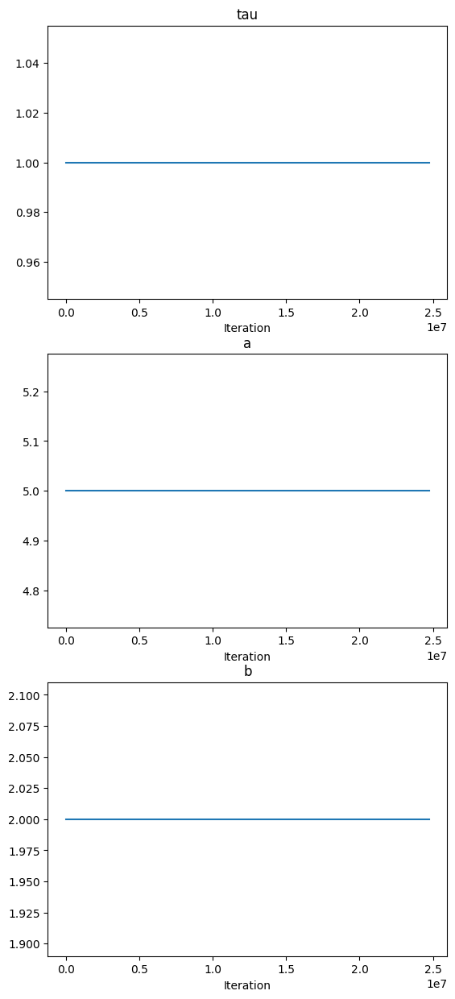

In [ ]:
curriculum = Curriculum(max_iter=int(N_EPOCHS*N_BATCHES_PER_EPOCH*BATCH_SIZE*0.5))
curriculum.add_param_list(
    [
    ("tau", curriculum.constant_scheduler(tau)),
    ("a", curriculum.constant_scheduler(a)),
    ("b", curriculum.constant_scheduler(b)),

    ]
)
curriculum.plot_all_schedules()

In [ ]:
curriculum.get_params(99*N_SAMPLES_PER_EPOCH)

{'tau': 1.0, 'a': 5.0, 'b': 2.0}

In [ ]:
data_generator = GenerateDataCurriculumCFM(
    pprogram_maker= make_lm_program_Laplace_ig_batched,
    curriculum= curriculum,
    #coupling = None
)

####################################################################################################
Epoch 0


100%|██████████| 10/10 [00:00<00:00, 22.95it/s]


{'X': {'mean': tensor(0.4998), 'variance': tensor(0.0834), 'min': tensor(1.1921e-07), 'max': tensor(1.0000)}, 'y': {'mean': tensor(0.0672), 'variance': tensor(3.8105), 'min': tensor(-11.5787), 'max': tensor(14.5816)}, 'beta': {'mean': tensor([0.0330, 0.0115, 0.0191, 0.0502, 0.0251]), 'variance': tensor([2.0128, 1.8904, 2.1706, 2.1343, 1.9933]), 'min': tensor([-7.6031, -6.9222, -7.3115, -8.8708, -6.4369]), 'max': tensor([7.8159, 7.0048, 8.0241, 9.5828, 8.8227])}}
Statistics for sigma_squared:
Mean: tensor([0.4906])
Variance: tensor([0.0717])
Min: tensor([0.1152])
Max: tensor([2.6970])


Statistics for time:
Mean: 0.5007058987626806
Variance: 0.08159720666306469
Min: 9.316205978393555e-05
Max: 0.99956876039505


Statistics for base_sample_beta:
Mean: tensor([-0.0027,  0.0174,  0.0070, -0.0070,  0.0313])
Variance: tensor([1.0141, 0.9869, 0.9820, 0.9821, 1.0050])
Min: tensor([-3.8449, -3.7098, -3.3814, -3.2789, -4.1558])
Max: tensor([3.0327, 3.1685, 3.4734, 2.9906, 3.2516])




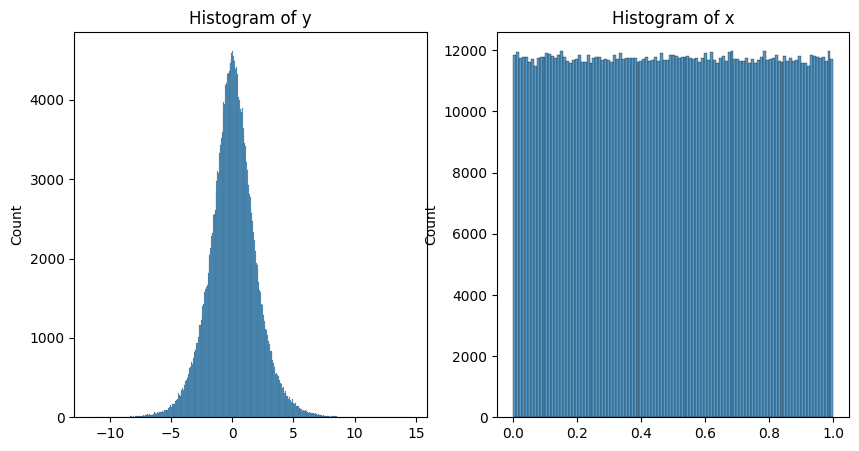

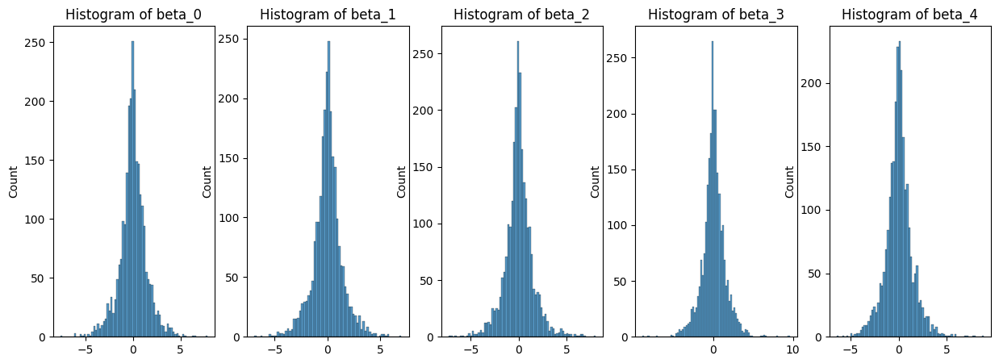

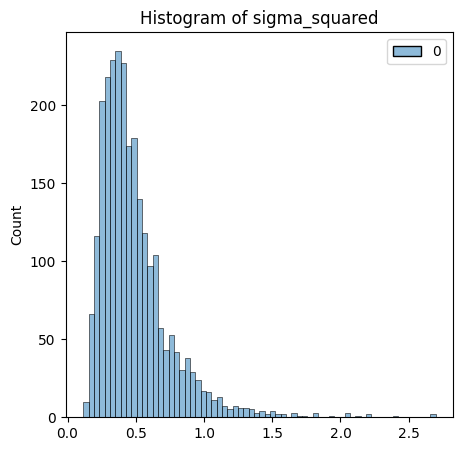

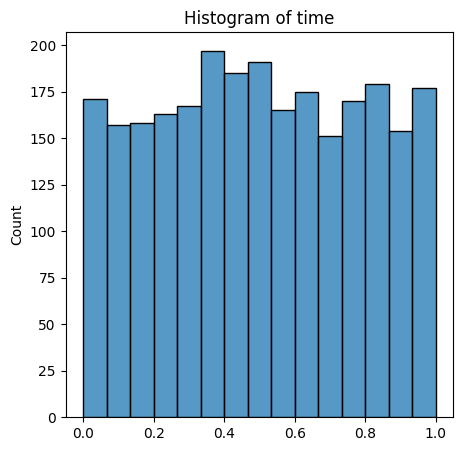

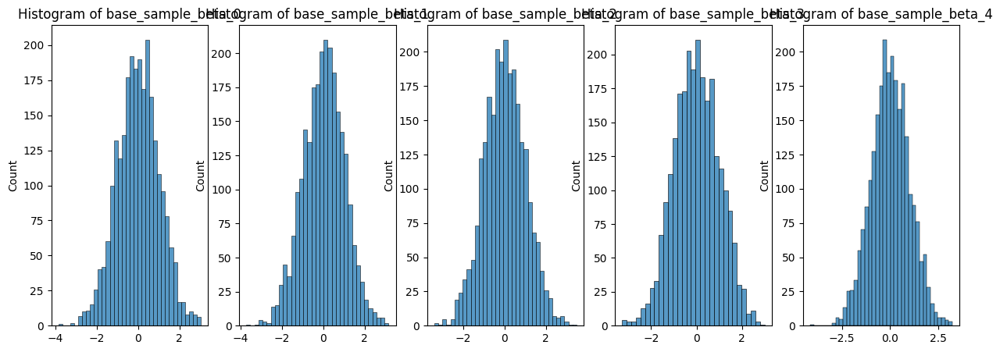

####################################################################################################
Epoch 99


100%|██████████| 10/10 [00:00<00:00, 78.99it/s]

{'X': {'mean': tensor(0.4999), 'variance': tensor(0.0834), 'min': tensor(2.3842e-07), 'max': tensor(1.0000)}, 'y': {'mean': tensor(0.0603), 'variance': tensor(3.5154), 'min': tensor(-13.9254), 'max': tensor(10.2085)}, 'beta': {'mean': tensor([ 0.0322,  0.0010,  0.0479,  0.0694, -0.0250]), 'variance': tensor([1.9920, 1.7937, 1.8512, 1.8015, 1.9732]), 'min': tensor([-8.9745, -5.8449, -6.4937, -9.0849, -7.5079]), 'max': tensor([7.1572, 6.6415, 8.2757, 7.7787, 9.0316])}}
Statistics for sigma_squared:
Mean: tensor([0.5004])
Variance: tensor([0.0737])
Min: tensor([0.1405])
Max: tensor([2.9161])


Statistics for time:
Mean: 0.49218768896535037
Variance: 0.0827056470314318
Min: 0.0004918575286865234
Max: 0.9992777705192566


Statistics for base_sample_beta:
Mean: tensor([-0.0124, -0.0125,  0.0567,  0.0289,  0.0150])
Variance: tensor([1.0014, 0.9799, 1.0100, 1.0055, 0.9805])
Min: tensor([-3.2707, -3.3928, -3.7479, -3.6541, -3.9491])
Max: tensor([3.7648, 4.7635, 3.2726, 3.0022, 3.4051])




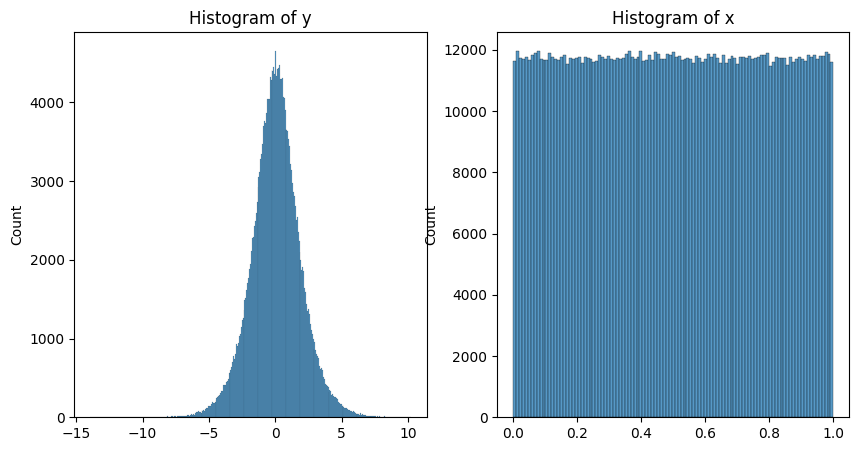

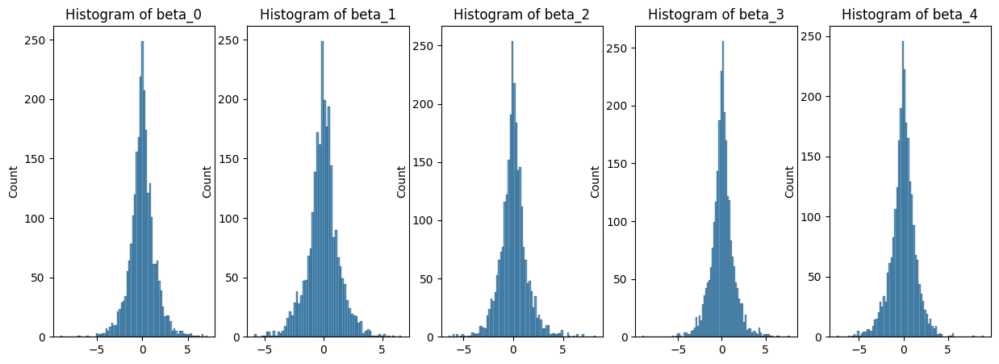

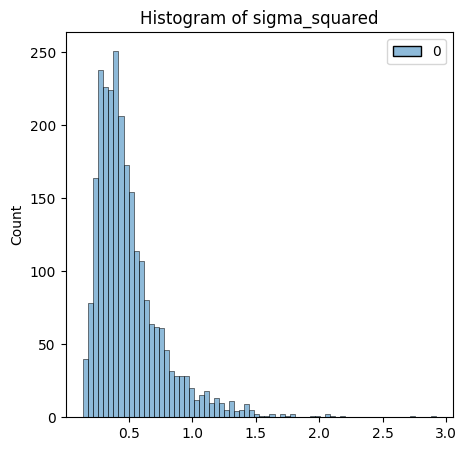

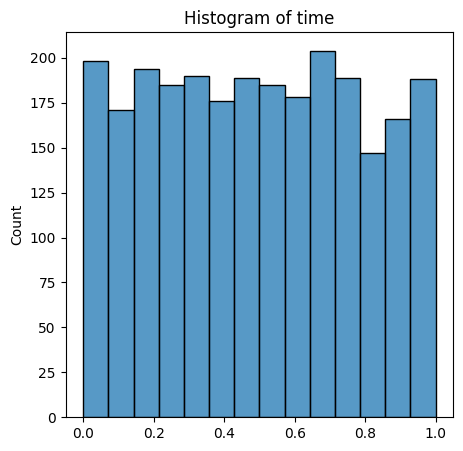

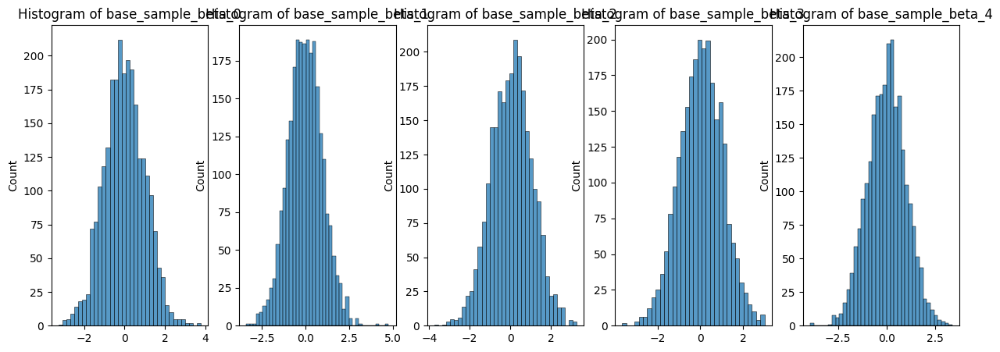

[{'X': {'mean': tensor(0.4998),
   'variance': tensor(0.0834),
   'min': tensor(1.1921e-07),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(0.0672),
   'variance': tensor(3.8105),
   'min': tensor(-11.5787),
   'max': tensor(14.5816)},
  'beta': {'mean': tensor([0.0330, 0.0115, 0.0191, 0.0502, 0.0251]),
   'variance': tensor([2.0128, 1.8904, 2.1706, 2.1343, 1.9933]),
   'min': tensor([-7.6031, -6.9222, -7.3115, -8.8708, -6.4369]),
   'max': tensor([7.8159, 7.0048, 8.0241, 9.5828, 8.8227])}},
 {'X': {'mean': tensor(0.4999),
   'variance': tensor(0.0834),
   'min': tensor(2.3842e-07),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(0.0603),
   'variance': tensor(3.5154),
   'min': tensor(-13.9254),
   'max': tensor(10.2085)},
  'beta': {'mean': tensor([ 0.0322,  0.0010,  0.0479,  0.0694, -0.0250]),
   'variance': tensor([1.9920, 1.7937, 1.8512, 1.8015, 1.9732]),
   'min': tensor([-8.9745, -5.8449, -6.4937, -9.0849, -7.5079]),
   'max': tensor([7.1572, 6.6415, 8.2757, 7.7787, 9.0316]

In [ ]:
data_generator.check_model(
    n_samples_per_epoch=N_SAMPLES_PER_EPOCH,
    epochs_to_check = [0, N_EPOCHS-1],
    p = 5,
    used_batch_samples = 10
)

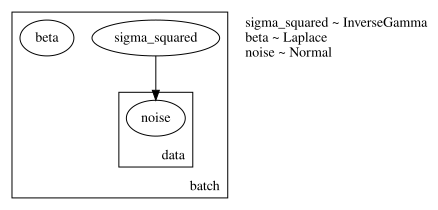

In [ ]:
data_generator.render_model()

In [ ]:
epoch_loader = data_generator.make_epoch_loader(
    n = N,
    p = P,
    number_of_batches_per_epoch = N_BATCHES_PER_EPOCH,
    n_epochs = N_EPOCHS,
    batch_size= BATCH_SIZE,
    train_frac= 0.5,
    val_frac= 0.1,
    shuffle=False,
    n_samples_to_generate_at_once = 250_000
)

The number of batches times the number of epochs must be equal to the total number of iterations in the curriculum. But got 49971200 and 24985600 respectively


In [ ]:
save_path_model = "/content/drive/MyDrive/PFN_Experiments/Training_Runs/experiment_2024_05_29_07_37_35/model.pth"

In [ ]:
encoder = TransformerReturnRepresentations(
    n_features= P+1,
    seq_len= N,
    d_model= 512,
    n_heads= 8,
    dim_feedforward=512*2,
    dropout_rate = 0.1,
    n_layers=6,
    n_skip_layers_final_heads = 2,
    n_output_units_per_head=[P, P*P, P]
)

encoder.load_state_dict(torch.load(save_path_model, map_location=torch.device('cpu')))
# get the correct class to transform model predictions to posterior samples

model_posterior = ModelPosteriorFullGaussian2(cov_reg_factor = 1e-3, use_lowrank_normal = False, diag_transform = lambda x: x**2)

nll_loss = model_posterior.negative_log_likelihood
nll_loss_avg = model_posterior.negative_log_likelihood_avg
nll_loss_std = model_posterior.negative_log_likelihood_std
nll_loss_median = model_posterior.negative_log_likelihood_median

mlp_to_process_encoder_output = MLP(
    n_input_units = encoder.d_model,
    n_output_units= 1024,
    n_hidden_units= 1024,
    n_skip_layers= 3,
    dropout_rate = 0.1
)

mlp_to_process_time_conditioning = MLP(
    n_input_units = 1,
    n_output_units = 512,
    n_hidden_units= 512,
    n_skip_layers= 2,
    dropout_rate = 0.1
)
decoder = TransformerDecoderConditionalDouble_parallel(
    n_input_features= P,
    d_model_decoder= 512,
    d_model_encoder= encoder.d_model,
    n_heads= 4,
    d_ff = 512*2,
    dropout= 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units,
    n_layers= 6,
    use_positional_encoding=False,
    use_self_attention=False,
)
mlp_to_process_decoder_output = MLPConditionalDouble_parallel(
    n_input_units= decoder.d_model_decoder,
    n_output_units = P,
    n_hidden_units = 1024,
    n_skip_layers = 4,
    dropout_rate = 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units
)
model = TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution(
    encoder = encoder,
    model_posterior = model_posterior,
    mlp_to_process_encoder_output = mlp_to_process_encoder_output,
    mlp_to_process_time_conditioning = mlp_to_process_time_conditioning,
    mlp_to_process_decoder_output = mlp_to_process_decoder_output,
    decoder = decoder,
    freeze_encoder=False,
)

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:306: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [ ]:
'{:.2e}'.format(count_parameters(model))

'1.05e+08'

In [ ]:
import torch
from torch.optim.lr_scheduler import ReduceLROnPlateau, OneCycleLR

In [ ]:
lr = 1e-4
opt = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-5)

In [ ]:
loss_fun = CFMLossOTGaussianBase_plus_NLL(
    weight_nll = 0.0,
    NLL_Loss_function= nll_loss,
    sigma_min=1e-5,
    return_sub_losses=True
)

In [ ]:
scheduler = OneCycleLR(opt,
                       max_lr = 1e-4,
                       epochs = N_EPOCHS,
                       steps_per_epoch = N_SAMPLES_PER_EPOCH//BATCH_SIZE,
                       pct_start = 0.1,
                       div_factor=25.0,
                       final_div_factor=1e2)

#scheduler = ReduceLROnPlateau(opt)

additional_evals = {
    "nll_loss": nll_loss,
    "nll_loss_avg": nll_loss_avg,
    "nll_loss_std": nll_loss_std,
    "nll_loss_median": nll_loss_median
}

In [ ]:
#?TrainerCurriculumCNF

In [ ]:
trainer = TrainerCurriculumCNF_LearnedBaseDist_plus_nll(
    model = model,
    optimizer=opt,
    scheduler = scheduler,
    loss_function=loss_fun,
    epoch_loader = epoch_loader,
    evaluation_functions= additional_evals,
    n_epochs = 100,
    early_stopping_patience = 200,
    schedule_step_on = "batch",
    save_path = SAVE_PATH,
    use_same_timestep_per_batch = False,
    use_train_mode_during_validation = False,
    sub_losses_names = ["loss_FM", "loss_NLL"],
    max_gradient_norm = 1.0,
    stop_gradients_from_FM_to_encoder = True

)

In [ ]:
#trainer.set_new_save_path("/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_14_09_47_47")
trainer.save_path

'/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_20_09_56_46'

In [ ]:
try:
  trainer.load_best_model()
except Exception as e:
  print("Could not load model")
  print(e)
  pass

Could not load model
[Errno 2] No such file or directory: '/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_20_09_56_46/model.pth'


In [ ]:
trainer.validate()

100%|██████████| 49/49 [00:32<00:00,  1.53it/s]


{'loss_mean': 1.3524755239486694,
 'loss_median': 0.9634490013122559,
 'loss_std': 0.9676193594932556,
 'loss_FM_mean': 1.3524755239486694,
 'loss_FM_median': 0.9634490013122559,
 'loss_FM_std': 0.9676193594932556,
 'loss_NLL_mean': -2.4581971168518066,
 'loss_NLL_median': -2.4661026000976562,
 'loss_NLL_std': 0.22829307615756989}

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/runs

<IPython.core.display.Javascript object>

In [ ]:
r = trainer.train()

Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 0


100%|██████████| 49/49 [00:29<00:00,  1.67it/s]


Epoch 0:
Training: {'loss_mean': 1.1233105659484863, 'loss_median': 0.9588004946708679, 'loss_std': 0.5803419351577759, 'loss_FM_mean': 1.1233105659484863, 'loss_FM_median': 0.9588004946708679, 'loss_FM_std': 0.5803419351577759, 'loss_NLL_mean': 17.056617736816406, 'loss_NLL_median': 17.082847595214844, 'loss_NLL_std': 1.7648653984069824}
Validation: {'loss_mean': 0.9817215204238892, 'loss_median': 0.32002437114715576, 'loss_std': 1.877333164215088, 'loss_FM_mean': 0.9817215204238892, 'loss_FM_median': 0.32002437114715576, 'loss_FM_std': 1.877333164215088, 'loss_NLL_mean': 14.363091468811035, 'loss_NLL_median': 14.308002471923828, 'loss_NLL_std': 0.41677096486091614}
Validation curriculum: {'loss_mean': 0.5699743032455444, 'loss_median': 0.32695478200912476, 'loss_std': 0.7081780433654785, 'loss_FM_mean': 0.5699743032455444, 'loss_FM_median': 0.32695478200912476, 'loss_FM_std': 0.7081780433654785, 'loss_NLL_mean': 14.404573440551758, 'loss_NLL_median': 14.400415420532227, 'loss_NLL_std

100%|██████████| 49/49 [00:29<00:00,  1.67it/s]


Epoch 1:
Training: {'loss_mean': 0.655356228351593, 'loss_median': 0.6054131388664246, 'loss_std': 0.1619105041027069, 'loss_FM_mean': 0.655356228351593, 'loss_FM_median': 0.6054131388664246, 'loss_FM_std': 0.1619105041027069, 'loss_NLL_mean': 17.08917808532715, 'loss_NLL_median': 17.08598518371582, 'loss_NLL_std': 1.6961355209350586}
Validation: {'loss_mean': 0.27195191383361816, 'loss_median': 0.24975214898586273, 'loss_std': 0.10182997584342957, 'loss_FM_mean': 0.27195191383361816, 'loss_FM_median': 0.24975214898586273, 'loss_FM_std': 0.10182997584342957, 'loss_NLL_mean': 14.026538848876953, 'loss_NLL_median': 14.043861389160156, 'loss_NLL_std': 0.470751017332077}
Validation curriculum: {'loss_mean': 0.27006521821022034, 'loss_median': 0.24470673501491547, 'loss_std': 0.13687415421009064, 'loss_FM_mean': 0.27006521821022034, 'loss_FM_median': 0.24470673501491547, 'loss_FM_std': 0.13687415421009064, 'loss_NLL_mean': 13.962239265441895, 'loss_NLL_median': 13.927871704101562, 'loss_NLL

100%|██████████| 49/49 [00:29<00:00,  1.67it/s]


Epoch 2:
Training: {'loss_mean': 0.4815620183944702, 'loss_median': 0.4760310649871826, 'loss_std': 0.07833927124738693, 'loss_FM_mean': 0.4815620183944702, 'loss_FM_median': 0.4760310649871826, 'loss_FM_std': 0.07833927124738693, 'loss_NLL_mean': 17.147933959960938, 'loss_NLL_median': 17.09320831298828, 'loss_NLL_std': 1.9467450380325317}
Validation: {'loss_mean': 0.20477162301540375, 'loss_median': 0.19002950191497803, 'loss_std': 0.055466730147600174, 'loss_FM_mean': 0.20477162301540375, 'loss_FM_median': 0.19002950191497803, 'loss_FM_std': 0.055466730147600174, 'loss_NLL_mean': 13.923047065734863, 'loss_NLL_median': 13.870811462402344, 'loss_NLL_std': 0.4646891951560974}
Validation curriculum: {'loss_mean': 0.23662425577640533, 'loss_median': 0.21513891220092773, 'loss_std': 0.08571252226829529, 'loss_FM_mean': 0.23662425577640533, 'loss_FM_median': 0.21513891220092773, 'loss_FM_std': 0.08571252226829529, 'loss_NLL_mean': 14.068086624145508, 'loss_NLL_median': 14.001592636108398, '

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


Epoch 3:
Training: {'loss_mean': 0.4199267029762268, 'loss_median': 0.4084164798259735, 'loss_std': 0.07230915129184723, 'loss_FM_mean': 0.4199267029762268, 'loss_FM_median': 0.4084164798259735, 'loss_FM_std': 0.07230915129184723, 'loss_NLL_mean': 17.093713760375977, 'loss_NLL_median': 16.89975357055664, 'loss_NLL_std': 1.8366501331329346}
Validation: {'loss_mean': 0.21606211364269257, 'loss_median': 0.21102623641490936, 'loss_std': 0.06576046347618103, 'loss_FM_mean': 0.21606211364269257, 'loss_FM_median': 0.21102623641490936, 'loss_FM_std': 0.06576046347618103, 'loss_NLL_mean': 14.178606033325195, 'loss_NLL_median': 14.263195037841797, 'loss_NLL_std': 0.4706959128379822}
Validation curriculum: {'loss_mean': 0.2163178026676178, 'loss_median': 0.2079300433397293, 'loss_std': 0.05670924112200737, 'loss_FM_mean': 0.2163178026676178, 'loss_FM_median': 0.2079300433397293, 'loss_FM_std': 0.05670924112200737, 'loss_NLL_mean': 14.166755676269531, 'loss_NLL_median': 14.107498168945312, 'loss_N

100%|██████████| 49/49 [00:28<00:00,  1.71it/s]


Epoch 4:
Training: {'loss_mean': 0.39263027906417847, 'loss_median': 0.3781389892101288, 'loss_std': 0.08182808011770248, 'loss_FM_mean': 0.39263027906417847, 'loss_FM_median': 0.3781389892101288, 'loss_FM_std': 0.08182808011770248, 'loss_NLL_mean': 16.974454879760742, 'loss_NLL_median': 16.8685302734375, 'loss_NLL_std': 1.831217646598816}
Validation: {'loss_mean': 0.19685307145118713, 'loss_median': 0.19624730944633484, 'loss_std': 0.043168678879737854, 'loss_FM_mean': 0.19685307145118713, 'loss_FM_median': 0.19624730944633484, 'loss_FM_std': 0.043168678879737854, 'loss_NLL_mean': 14.424778938293457, 'loss_NLL_median': 14.41678237915039, 'loss_NLL_std': 0.4517115652561188}
Validation curriculum: {'loss_mean': 0.19289487600326538, 'loss_median': 0.17629574239253998, 'loss_std': 0.04307161644101143, 'loss_FM_mean': 0.19289487600326538, 'loss_FM_median': 0.17629574239253998, 'loss_FM_std': 0.04307161644101143, 'loss_NLL_mean': 14.413070678710938, 'loss_NLL_median': 14.570484161376953, 'l

100%|██████████| 49/49 [00:29<00:00,  1.66it/s]


Epoch 5:
Training: {'loss_mean': 0.3747790455818176, 'loss_median': 0.36108270287513733, 'loss_std': 0.07307387888431549, 'loss_FM_mean': 0.3747790455818176, 'loss_FM_median': 0.36108270287513733, 'loss_FM_std': 0.07307387888431549, 'loss_NLL_mean': 16.946247100830078, 'loss_NLL_median': 16.91366195678711, 'loss_NLL_std': 1.9312305450439453}
Validation: {'loss_mean': 0.17273014783859253, 'loss_median': 0.16333189606666565, 'loss_std': 0.03685816377401352, 'loss_FM_mean': 0.17273014783859253, 'loss_FM_median': 0.16333189606666565, 'loss_FM_std': 0.03685816377401352, 'loss_NLL_mean': 13.647553443908691, 'loss_NLL_median': 13.652816772460938, 'loss_NLL_std': 0.531124472618103}
Validation curriculum: {'loss_mean': 0.16929708421230316, 'loss_median': 0.16200478374958038, 'loss_std': 0.030117085203528404, 'loss_FM_mean': 0.16929708421230316, 'loss_FM_median': 0.16200478374958038, 'loss_FM_std': 0.030117085203528404, 'loss_NLL_mean': 13.494682312011719, 'loss_NLL_median': 13.478250503540039, 

100%|██████████| 49/49 [00:29<00:00,  1.66it/s]


Epoch 6:
Training: {'loss_mean': 0.3610706627368927, 'loss_median': 0.34149977564811707, 'loss_std': 0.07987567037343979, 'loss_FM_mean': 0.3610706627368927, 'loss_FM_median': 0.34149977564811707, 'loss_FM_std': 0.07987567037343979, 'loss_NLL_mean': 17.032211303710938, 'loss_NLL_median': 17.09960174560547, 'loss_NLL_std': 1.804998755455017}
Validation: {'loss_mean': 0.17866523563861847, 'loss_median': 0.17314474284648895, 'loss_std': 0.04071352258324623, 'loss_FM_mean': 0.17866523563861847, 'loss_FM_median': 0.17314474284648895, 'loss_FM_std': 0.04071352258324623, 'loss_NLL_mean': 14.159770011901855, 'loss_NLL_median': 14.007211685180664, 'loss_NLL_std': 0.5679371953010559}
Validation curriculum: {'loss_mean': 0.18199597299098969, 'loss_median': 0.16643643379211426, 'loss_std': 0.050832074135541916, 'loss_FM_mean': 0.18199597299098969, 'loss_FM_median': 0.16643643379211426, 'loss_FM_std': 0.050832074135541916, 'loss_NLL_mean': 14.187232971191406, 'loss_NLL_median': 14.152313232421875, 

100%|██████████| 49/49 [00:29<00:00,  1.67it/s]


Epoch 7:
Training: {'loss_mean': 0.3668059706687927, 'loss_median': 0.35044217109680176, 'loss_std': 0.08248210698366165, 'loss_FM_mean': 0.3668059706687927, 'loss_FM_median': 0.35044217109680176, 'loss_FM_std': 0.08248210698366165, 'loss_NLL_mean': 16.924592971801758, 'loss_NLL_median': 16.750595092773438, 'loss_NLL_std': 1.7213363647460938}
Validation: {'loss_mean': 0.19518586993217468, 'loss_median': 0.18209587037563324, 'loss_std': 0.051681384444236755, 'loss_FM_mean': 0.19518586993217468, 'loss_FM_median': 0.18209587037563324, 'loss_FM_std': 0.051681384444236755, 'loss_NLL_mean': 14.552193641662598, 'loss_NLL_median': 14.526805877685547, 'loss_NLL_std': 0.5113271474838257}
Validation curriculum: {'loss_mean': 0.20622698962688446, 'loss_median': 0.1870030015707016, 'loss_std': 0.06356934458017349, 'loss_FM_mean': 0.20622698962688446, 'loss_FM_median': 0.1870030015707016, 'loss_FM_std': 0.06356934458017349, 'loss_NLL_mean': 14.498531341552734, 'loss_NLL_median': 14.480592727661133, 

100%|██████████| 49/49 [00:29<00:00,  1.69it/s]


Epoch 8:
Training: {'loss_mean': 0.3529185950756073, 'loss_median': 0.3450412154197693, 'loss_std': 0.0690738707780838, 'loss_FM_mean': 0.3529185950756073, 'loss_FM_median': 0.3450412154197693, 'loss_FM_std': 0.0690738707780838, 'loss_NLL_mean': 17.030986785888672, 'loss_NLL_median': 16.98784828186035, 'loss_NLL_std': 1.9853119850158691}
Validation: {'loss_mean': 0.19786785542964935, 'loss_median': 0.19445429742336273, 'loss_std': 0.04812374711036682, 'loss_FM_mean': 0.19786785542964935, 'loss_FM_median': 0.19445429742336273, 'loss_FM_std': 0.04812374711036682, 'loss_NLL_mean': 14.543431282043457, 'loss_NLL_median': 14.470650672912598, 'loss_NLL_std': 0.5188787579536438}
Validation curriculum: {'loss_mean': 0.2020491361618042, 'loss_median': 0.19461850821971893, 'loss_std': 0.04727112501859665, 'loss_FM_mean': 0.2020491361618042, 'loss_FM_median': 0.19461850821971893, 'loss_FM_std': 0.04727112501859665, 'loss_NLL_mean': 14.496513366699219, 'loss_NLL_median': 14.437374114990234, 'loss_N

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


Epoch 9:
Training: {'loss_mean': 0.34987935423851013, 'loss_median': 0.34119912981987, 'loss_std': 0.06790885329246521, 'loss_FM_mean': 0.34987935423851013, 'loss_FM_median': 0.34119912981987, 'loss_FM_std': 0.06790885329246521, 'loss_NLL_mean': 17.033884048461914, 'loss_NLL_median': 16.803075790405273, 'loss_NLL_std': 1.7603317499160767}
Validation: {'loss_mean': 0.18995535373687744, 'loss_median': 0.1774701476097107, 'loss_std': 0.049962736666202545, 'loss_FM_mean': 0.18995535373687744, 'loss_FM_median': 0.1774701476097107, 'loss_FM_std': 0.049962736666202545, 'loss_NLL_mean': 14.544498443603516, 'loss_NLL_median': 14.642566680908203, 'loss_NLL_std': 0.4640805721282959}
Validation curriculum: {'loss_mean': 0.1789192259311676, 'loss_median': 0.16444170475006104, 'loss_std': 0.0484466515481472, 'loss_FM_mean': 0.1789192259311676, 'loss_FM_median': 0.16444170475006104, 'loss_FM_std': 0.0484466515481472, 'loss_NLL_mean': 14.457986831665039, 'loss_NLL_median': 14.5052490234375, 'loss_NLL_

100%|██████████| 49/49 [00:28<00:00,  1.70it/s]


Epoch 10:
Training: {'loss_mean': 0.3608010411262512, 'loss_median': 0.34395214915275574, 'loss_std': 0.07792282849550247, 'loss_FM_mean': 0.3608010411262512, 'loss_FM_median': 0.34395214915275574, 'loss_FM_std': 0.07792282849550247, 'loss_NLL_mean': 17.008649826049805, 'loss_NLL_median': 16.99593162536621, 'loss_NLL_std': 1.8418680429458618}
Validation: {'loss_mean': 0.19140368700027466, 'loss_median': 0.17951570451259613, 'loss_std': 0.04928046464920044, 'loss_FM_mean': 0.19140368700027466, 'loss_FM_median': 0.17951570451259613, 'loss_FM_std': 0.04928046464920044, 'loss_NLL_mean': 14.320613861083984, 'loss_NLL_median': 14.310306549072266, 'loss_NLL_std': 0.4160408675670624}
Validation curriculum: {'loss_mean': 0.203184112906456, 'loss_median': 0.18633316457271576, 'loss_std': 0.05004951357841492, 'loss_FM_mean': 0.203184112906456, 'loss_FM_median': 0.18633316457271576, 'loss_FM_std': 0.05004951357841492, 'loss_NLL_mean': 14.242833137512207, 'loss_NLL_median': 14.177589416503906, 'los

100%|██████████| 49/49 [00:29<00:00,  1.66it/s]


Epoch 11:
Training: {'loss_mean': 0.35799530148506165, 'loss_median': 0.3442155718803406, 'loss_std': 0.07165943831205368, 'loss_FM_mean': 0.35799530148506165, 'loss_FM_median': 0.3442155718803406, 'loss_FM_std': 0.07165943831205368, 'loss_NLL_mean': 16.905052185058594, 'loss_NLL_median': 16.830360412597656, 'loss_NLL_std': 1.8230777978897095}
Validation: {'loss_mean': 0.20010066032409668, 'loss_median': 0.17905540764331818, 'loss_std': 0.06764195114374161, 'loss_FM_mean': 0.20010066032409668, 'loss_FM_median': 0.17905540764331818, 'loss_FM_std': 0.06764195114374161, 'loss_NLL_mean': 14.457385063171387, 'loss_NLL_median': 14.469783782958984, 'loss_NLL_std': 0.6189413070678711}
Validation curriculum: {'loss_mean': 0.18660424649715424, 'loss_median': 0.17552819848060608, 'loss_std': 0.05550621077418327, 'loss_FM_mean': 0.18660424649715424, 'loss_FM_median': 0.17552819848060608, 'loss_FM_std': 0.05550621077418327, 'loss_NLL_mean': 14.465950965881348, 'loss_NLL_median': 14.51164436340332, 

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


Epoch 12:
Training: {'loss_mean': 0.3653835654258728, 'loss_median': 0.3574899435043335, 'loss_std': 0.07892574369907379, 'loss_FM_mean': 0.3653835654258728, 'loss_FM_median': 0.3574899435043335, 'loss_FM_std': 0.07892574369907379, 'loss_NLL_mean': 17.103689193725586, 'loss_NLL_median': 16.894746780395508, 'loss_NLL_std': 1.879705786705017}
Validation: {'loss_mean': 0.22249633073806763, 'loss_median': 0.19007453322410583, 'loss_std': 0.09931240230798721, 'loss_FM_mean': 0.22249633073806763, 'loss_FM_median': 0.19007453322410583, 'loss_FM_std': 0.09931240230798721, 'loss_NLL_mean': 14.543810844421387, 'loss_NLL_median': 14.514293670654297, 'loss_NLL_std': 0.5827372074127197}
Validation curriculum: {'loss_mean': 0.21665357053279877, 'loss_median': 0.1988854706287384, 'loss_std': 0.07566533982753754, 'loss_FM_mean': 0.21665357053279877, 'loss_FM_median': 0.1988854706287384, 'loss_FM_std': 0.07566533982753754, 'loss_NLL_mean': 14.497468948364258, 'loss_NLL_median': 14.483488082885742, 'los

100%|██████████| 49/49 [00:28<00:00,  1.69it/s]


Epoch 13:
Training: {'loss_mean': 0.36768677830696106, 'loss_median': 0.35692307353019714, 'loss_std': 0.07803851366043091, 'loss_FM_mean': 0.36768677830696106, 'loss_FM_median': 0.35692307353019714, 'loss_FM_std': 0.07803851366043091, 'loss_NLL_mean': 16.915008544921875, 'loss_NLL_median': 16.85295867919922, 'loss_NLL_std': 1.76488196849823}
Validation: {'loss_mean': 0.18942587077617645, 'loss_median': 0.17825858294963837, 'loss_std': 0.04896815866231918, 'loss_FM_mean': 0.18942587077617645, 'loss_FM_median': 0.17825858294963837, 'loss_FM_std': 0.04896815866231918, 'loss_NLL_mean': 14.300302505493164, 'loss_NLL_median': 14.261329650878906, 'loss_NLL_std': 0.5556944608688354}
Validation curriculum: {'loss_mean': 0.1907380223274231, 'loss_median': 0.18007344007492065, 'loss_std': 0.05060899630188942, 'loss_FM_mean': 0.1907380223274231, 'loss_FM_median': 0.18007344007492065, 'loss_FM_std': 0.05060899630188942, 'loss_NLL_mean': 14.2821044921875, 'loss_NLL_median': 14.308469772338867, 'los

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


Epoch 14:
Training: {'loss_mean': 0.3517320156097412, 'loss_median': 0.3363916575908661, 'loss_std': 0.0730169266462326, 'loss_FM_mean': 0.3517320156097412, 'loss_FM_median': 0.3363916575908661, 'loss_FM_std': 0.0730169266462326, 'loss_NLL_mean': 17.226808547973633, 'loss_NLL_median': 17.050846099853516, 'loss_NLL_std': 1.8692353963851929}
Validation: {'loss_mean': 0.18415158987045288, 'loss_median': 0.17318032681941986, 'loss_std': 0.05278455838561058, 'loss_FM_mean': 0.18415158987045288, 'loss_FM_median': 0.17318032681941986, 'loss_FM_std': 0.05278455838561058, 'loss_NLL_mean': 14.506053924560547, 'loss_NLL_median': 14.41551685333252, 'loss_NLL_std': 0.6104593873023987}
Validation curriculum: {'loss_mean': 0.17594221234321594, 'loss_median': 0.1704779416322708, 'loss_std': 0.03751781955361366, 'loss_FM_mean': 0.17594221234321594, 'loss_FM_median': 0.1704779416322708, 'loss_FM_std': 0.03751781955361366, 'loss_NLL_mean': 14.298175811767578, 'loss_NLL_median': 14.267648696899414, 'loss_

100%|██████████| 49/49 [00:29<00:00,  1.66it/s]


Epoch 15:
Training: {'loss_mean': 0.36173543334007263, 'loss_median': 0.3475583493709564, 'loss_std': 0.07672931998968124, 'loss_FM_mean': 0.36173543334007263, 'loss_FM_median': 0.3475583493709564, 'loss_FM_std': 0.07672931998968124, 'loss_NLL_mean': 17.025869369506836, 'loss_NLL_median': 16.88547134399414, 'loss_NLL_std': 1.897856593132019}
Validation: {'loss_mean': 0.187054842710495, 'loss_median': 0.1770750880241394, 'loss_std': 0.05003855377435684, 'loss_FM_mean': 0.187054842710495, 'loss_FM_median': 0.1770750880241394, 'loss_FM_std': 0.05003855377435684, 'loss_NLL_mean': 14.159658432006836, 'loss_NLL_median': 14.128948211669922, 'loss_NLL_std': 0.6228529810905457}
Validation curriculum: {'loss_mean': 0.19437846541404724, 'loss_median': 0.18995560705661774, 'loss_std': 0.05502524971961975, 'loss_FM_mean': 0.19437846541404724, 'loss_FM_median': 0.18995560705661774, 'loss_FM_std': 0.05502524971961975, 'loss_NLL_mean': 14.174596786499023, 'loss_NLL_median': 14.087931632995605, 'loss_N

100%|██████████| 49/49 [00:28<00:00,  1.69it/s]


Epoch 16:
Training: {'loss_mean': 0.3517175018787384, 'loss_median': 0.3358364999294281, 'loss_std': 0.07936199009418488, 'loss_FM_mean': 0.3517175018787384, 'loss_FM_median': 0.3358364999294281, 'loss_FM_std': 0.07936199009418488, 'loss_NLL_mean': 16.697620391845703, 'loss_NLL_median': 16.55950164794922, 'loss_NLL_std': 1.7589783668518066}
Validation: {'loss_mean': 0.19550907611846924, 'loss_median': 0.18390598893165588, 'loss_std': 0.05478070676326752, 'loss_FM_mean': 0.19550907611846924, 'loss_FM_median': 0.18390598893165588, 'loss_FM_std': 0.05478070676326752, 'loss_NLL_mean': 13.207294464111328, 'loss_NLL_median': 13.28825569152832, 'loss_NLL_std': 0.43639928102493286}
Validation curriculum: {'loss_mean': 0.20369242131710052, 'loss_median': 0.1916653960943222, 'loss_std': 0.060151685029268265, 'loss_FM_mean': 0.20369242131710052, 'loss_FM_median': 0.1916653960943222, 'loss_FM_std': 0.060151685029268265, 'loss_NLL_mean': 13.233199119567871, 'loss_NLL_median': 13.26563835144043, 'lo

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


Epoch 17:
Training: {'loss_mean': 0.35675153136253357, 'loss_median': 0.3404413163661957, 'loss_std': 0.07586988806724548, 'loss_FM_mean': 0.35675153136253357, 'loss_FM_median': 0.3404413163661957, 'loss_FM_std': 0.07586988806724548, 'loss_NLL_mean': 16.829362869262695, 'loss_NLL_median': 16.62964630126953, 'loss_NLL_std': 1.6901715993881226}
Validation: {'loss_mean': 0.1805550754070282, 'loss_median': 0.16572938859462738, 'loss_std': 0.04402878135442734, 'loss_FM_mean': 0.1805550754070282, 'loss_FM_median': 0.16572938859462738, 'loss_FM_std': 0.04402878135442734, 'loss_NLL_mean': 14.890336990356445, 'loss_NLL_median': 14.992086410522461, 'loss_NLL_std': 0.5084412097930908}
Validation curriculum: {'loss_mean': 0.17298157513141632, 'loss_median': 0.1635054647922516, 'loss_std': 0.031243903562426567, 'loss_FM_mean': 0.17298157513141632, 'loss_FM_median': 0.1635054647922516, 'loss_FM_std': 0.031243903562426567, 'loss_NLL_mean': 14.86742877960205, 'loss_NLL_median': 14.97309398651123, 'los

100%|██████████| 49/49 [00:28<00:00,  1.70it/s]


Epoch 18:
Training: {'loss_mean': 0.3460850417613983, 'loss_median': 0.33390894532203674, 'loss_std': 0.06230395287275314, 'loss_FM_mean': 0.3460850417613983, 'loss_FM_median': 0.33390894532203674, 'loss_FM_std': 0.06230395287275314, 'loss_NLL_mean': 17.145431518554688, 'loss_NLL_median': 17.183391571044922, 'loss_NLL_std': 1.6119767427444458}
Validation: {'loss_mean': 0.2051611691713333, 'loss_median': 0.19230268895626068, 'loss_std': 0.0600399374961853, 'loss_FM_mean': 0.2051611691713333, 'loss_FM_median': 0.19230268895626068, 'loss_FM_std': 0.0600399374961853, 'loss_NLL_mean': 14.441601753234863, 'loss_NLL_median': 14.392228126525879, 'loss_NLL_std': 0.4335261881351471}
Validation curriculum: {'loss_mean': 0.19203095138072968, 'loss_median': 0.18974700570106506, 'loss_std': 0.04251488298177719, 'loss_FM_mean': 0.19203095138072968, 'loss_FM_median': 0.18974700570106506, 'loss_FM_std': 0.04251488298177719, 'loss_NLL_mean': 14.434833526611328, 'loss_NLL_median': 14.447463989257812, 'lo

100%|██████████| 49/49 [00:28<00:00,  1.70it/s]


Epoch 19:
Training: {'loss_mean': 0.3597225248813629, 'loss_median': 0.3412116467952728, 'loss_std': 0.07771893590688705, 'loss_FM_mean': 0.3597225248813629, 'loss_FM_median': 0.3412116467952728, 'loss_FM_std': 0.07771893590688705, 'loss_NLL_mean': 17.01514434814453, 'loss_NLL_median': 16.845542907714844, 'loss_NLL_std': 1.6693354845046997}
Validation: {'loss_mean': 0.18586274981498718, 'loss_median': 0.1860671192407608, 'loss_std': 0.03669953718781471, 'loss_FM_mean': 0.18586274981498718, 'loss_FM_median': 0.1860671192407608, 'loss_FM_std': 0.03669953718781471, 'loss_NLL_mean': 14.008033752441406, 'loss_NLL_median': 13.964282035827637, 'loss_NLL_std': 0.4166829586029053}
Validation curriculum: {'loss_mean': 0.18581528961658478, 'loss_median': 0.1799800843000412, 'loss_std': 0.040007706731557846, 'loss_FM_mean': 0.18581528961658478, 'loss_FM_median': 0.1799800843000412, 'loss_FM_std': 0.040007706731557846, 'loss_NLL_mean': 13.85252571105957, 'loss_NLL_median': 13.861519813537598, 'loss

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


Epoch 20:
Training: {'loss_mean': 0.3490065932273865, 'loss_median': 0.33565136790275574, 'loss_std': 0.07189179211854935, 'loss_FM_mean': 0.3490065932273865, 'loss_FM_median': 0.33565136790275574, 'loss_FM_std': 0.07189179211854935, 'loss_NLL_mean': 16.979398727416992, 'loss_NLL_median': 17.09813690185547, 'loss_NLL_std': 1.9117611646652222}
Validation: {'loss_mean': 0.18779116868972778, 'loss_median': 0.17761610448360443, 'loss_std': 0.04847858473658562, 'loss_FM_mean': 0.18779116868972778, 'loss_FM_median': 0.17761610448360443, 'loss_FM_std': 0.04847858473658562, 'loss_NLL_mean': 14.517038345336914, 'loss_NLL_median': 14.545275688171387, 'loss_NLL_std': 0.4285942614078522}
Validation curriculum: {'loss_mean': 0.18600067496299744, 'loss_median': 0.17257194221019745, 'loss_std': 0.05086110904812813, 'loss_FM_mean': 0.18600067496299744, 'loss_FM_median': 0.17257194221019745, 'loss_FM_std': 0.05086110904812813, 'loss_NLL_mean': 14.76849365234375, 'loss_NLL_median': 14.670595169067383, '

100%|██████████| 49/49 [00:29<00:00,  1.67it/s]


Epoch 21:
Training: {'loss_mean': 0.3422611951828003, 'loss_median': 0.32934585213661194, 'loss_std': 0.07038047909736633, 'loss_FM_mean': 0.3422611951828003, 'loss_FM_median': 0.32934585213661194, 'loss_FM_std': 0.07038047909736633, 'loss_NLL_mean': 16.860918045043945, 'loss_NLL_median': 16.804040908813477, 'loss_NLL_std': 1.9843668937683105}
Validation: {'loss_mean': 0.17890751361846924, 'loss_median': 0.16760948300361633, 'loss_std': 0.05131690576672554, 'loss_FM_mean': 0.17890751361846924, 'loss_FM_median': 0.16760948300361633, 'loss_FM_std': 0.05131690576672554, 'loss_NLL_mean': 14.145334243774414, 'loss_NLL_median': 14.127620697021484, 'loss_NLL_std': 0.44372013211250305}
Validation curriculum: {'loss_mean': 0.19449827075004578, 'loss_median': 0.1740236133337021, 'loss_std': 0.06570188701152802, 'loss_FM_mean': 0.19449827075004578, 'loss_FM_median': 0.1740236133337021, 'loss_FM_std': 0.06570188701152802, 'loss_NLL_mean': 14.1968994140625, 'loss_NLL_median': 14.128666877746582, 'l

100%|██████████| 49/49 [00:29<00:00,  1.65it/s]


Epoch 22:
Training: {'loss_mean': 0.3604048490524292, 'loss_median': 0.3461891710758209, 'loss_std': 0.07731765508651733, 'loss_FM_mean': 0.3604048490524292, 'loss_FM_median': 0.3461891710758209, 'loss_FM_std': 0.07731765508651733, 'loss_NLL_mean': 17.029359817504883, 'loss_NLL_median': 16.811141967773438, 'loss_NLL_std': 1.731794834136963}
Validation: {'loss_mean': 0.19184823334217072, 'loss_median': 0.1728782206773758, 'loss_std': 0.05824976786971092, 'loss_FM_mean': 0.19184823334217072, 'loss_FM_median': 0.1728782206773758, 'loss_FM_std': 0.05824976786971092, 'loss_NLL_mean': 14.2643461227417, 'loss_NLL_median': 14.262859344482422, 'loss_NLL_std': 0.3802611529827118}
Validation curriculum: {'loss_mean': 0.192379429936409, 'loss_median': 0.18737924098968506, 'loss_std': 0.0417189858853817, 'loss_FM_mean': 0.192379429936409, 'loss_FM_median': 0.18737924098968506, 'loss_FM_std': 0.0417189858853817, 'loss_NLL_mean': 14.440726280212402, 'loss_NLL_median': 14.433271408081055, 'loss_NLL_st

100%|██████████| 49/49 [00:29<00:00,  1.66it/s]


Epoch 23:
Training: {'loss_mean': 0.364225298166275, 'loss_median': 0.3512420952320099, 'loss_std': 0.07765112817287445, 'loss_FM_mean': 0.364225298166275, 'loss_FM_median': 0.3512420952320099, 'loss_FM_std': 0.07765112817287445, 'loss_NLL_mean': 16.98311996459961, 'loss_NLL_median': 16.91849708557129, 'loss_NLL_std': 1.8555412292480469}
Validation: {'loss_mean': 0.18978342413902283, 'loss_median': 0.17423687875270844, 'loss_std': 0.0695541724562645, 'loss_FM_mean': 0.18978342413902283, 'loss_FM_median': 0.17423687875270844, 'loss_FM_std': 0.0695541724562645, 'loss_NLL_mean': 14.328370094299316, 'loss_NLL_median': 14.370321273803711, 'loss_NLL_std': 0.44845062494277954}
Validation curriculum: {'loss_mean': 0.17401744425296783, 'loss_median': 0.1726052314043045, 'loss_std': 0.03309416025876999, 'loss_FM_mean': 0.17401744425296783, 'loss_FM_median': 0.1726052314043045, 'loss_FM_std': 0.03309416025876999, 'loss_NLL_mean': 14.279378890991211, 'loss_NLL_median': 14.288177490234375, 'loss_NL

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


Epoch 24:
Training: {'loss_mean': 0.35475677251815796, 'loss_median': 0.3416486084461212, 'loss_std': 0.07242808490991592, 'loss_FM_mean': 0.35475677251815796, 'loss_FM_median': 0.3416486084461212, 'loss_FM_std': 0.07242808490991592, 'loss_NLL_mean': 17.3382625579834, 'loss_NLL_median': 17.3243350982666, 'loss_NLL_std': 1.9182168245315552}
Validation: {'loss_mean': 0.1740446537733078, 'loss_median': 0.16568687558174133, 'loss_std': 0.04249747097492218, 'loss_FM_mean': 0.1740446537733078, 'loss_FM_median': 0.16568687558174133, 'loss_FM_std': 0.04249747097492218, 'loss_NLL_mean': 14.928428649902344, 'loss_NLL_median': 14.836565971374512, 'loss_NLL_std': 0.5197253227233887}
Validation curriculum: {'loss_mean': 0.1711500585079193, 'loss_median': 0.1652197390794754, 'loss_std': 0.0388735830783844, 'loss_FM_mean': 0.1711500585079193, 'loss_FM_median': 0.1652197390794754, 'loss_FM_std': 0.0388735830783844, 'loss_NLL_mean': 14.842093467712402, 'loss_NLL_median': 14.739789962768555, 'loss_NLL_s

100%|██████████| 49/49 [00:28<00:00,  1.71it/s]


Epoch 25:
Training: {'loss_mean': 0.35256701707839966, 'loss_median': 0.33619004487991333, 'loss_std': 0.08734866976737976, 'loss_FM_mean': 0.35256701707839966, 'loss_FM_median': 0.33619004487991333, 'loss_FM_std': 0.08734866976737976, 'loss_NLL_mean': 17.134611129760742, 'loss_NLL_median': 16.77588653564453, 'loss_NLL_std': 1.8777623176574707}
Validation: {'loss_mean': 0.17604796588420868, 'loss_median': 0.16042546927928925, 'loss_std': 0.04761485382914543, 'loss_FM_mean': 0.17604796588420868, 'loss_FM_median': 0.16042546927928925, 'loss_FM_std': 0.04761485382914543, 'loss_NLL_mean': 14.961840629577637, 'loss_NLL_median': 14.869915008544922, 'loss_NLL_std': 0.4177416265010834}
Validation curriculum: {'loss_mean': 0.17861132323741913, 'loss_median': 0.16473598778247833, 'loss_std': 0.04377431422472, 'loss_FM_mean': 0.17861132323741913, 'loss_FM_median': 0.16473598778247833, 'loss_FM_std': 0.04377431422472, 'loss_NLL_mean': 14.859127044677734, 'loss_NLL_median': 14.914314270019531, 'los

100%|██████████| 49/49 [00:29<00:00,  1.67it/s]


Epoch 26:
Training: {'loss_mean': 0.3531029522418976, 'loss_median': 0.34100261330604553, 'loss_std': 0.07270415127277374, 'loss_FM_mean': 0.3531029522418976, 'loss_FM_median': 0.34100261330604553, 'loss_FM_std': 0.07270415127277374, 'loss_NLL_mean': 17.144784927368164, 'loss_NLL_median': 17.12246322631836, 'loss_NLL_std': 1.876800537109375}
Validation: {'loss_mean': 0.18298575282096863, 'loss_median': 0.16876237094402313, 'loss_std': 0.045475345104932785, 'loss_FM_mean': 0.18298575282096863, 'loss_FM_median': 0.16876237094402313, 'loss_FM_std': 0.045475345104932785, 'loss_NLL_mean': 14.300395965576172, 'loss_NLL_median': 14.246732711791992, 'loss_NLL_std': 0.5277864336967468}
Validation curriculum: {'loss_mean': 0.18004335463047028, 'loss_median': 0.16827546060085297, 'loss_std': 0.047129176557064056, 'loss_FM_mean': 0.18004335463047028, 'loss_FM_median': 0.16827546060085297, 'loss_FM_std': 0.047129176557064056, 'loss_NLL_mean': 14.345012664794922, 'loss_NLL_median': 14.27345943450927

100%|██████████| 49/49 [00:28<00:00,  1.69it/s]


Epoch 27:
Training: {'loss_mean': 0.35859617590904236, 'loss_median': 0.34867945313453674, 'loss_std': 0.07854164391756058, 'loss_FM_mean': 0.35859617590904236, 'loss_FM_median': 0.34867945313453674, 'loss_FM_std': 0.07854164391756058, 'loss_NLL_mean': 16.941143035888672, 'loss_NLL_median': 16.714984893798828, 'loss_NLL_std': 1.8874566555023193}
Validation: {'loss_mean': 0.1773373931646347, 'loss_median': 0.16895358264446259, 'loss_std': 0.05740417167544365, 'loss_FM_mean': 0.1773373931646347, 'loss_FM_median': 0.16895358264446259, 'loss_FM_std': 0.05740417167544365, 'loss_NLL_mean': 14.125306129455566, 'loss_NLL_median': 14.177125930786133, 'loss_NLL_std': 0.6226311326026917}
Validation curriculum: {'loss_mean': 0.16857104003429413, 'loss_median': 0.15831482410430908, 'loss_std': 0.04344234988093376, 'loss_FM_mean': 0.16857104003429413, 'loss_FM_median': 0.15831482410430908, 'loss_FM_std': 0.04344234988093376, 'loss_NLL_mean': 14.1690092086792, 'loss_NLL_median': 14.199417114257812, '

100%|██████████| 49/49 [00:29<00:00,  1.66it/s]


Epoch 28:
Training: {'loss_mean': 0.3431982398033142, 'loss_median': 0.33759257197380066, 'loss_std': 0.06452521681785583, 'loss_FM_mean': 0.3431982398033142, 'loss_FM_median': 0.33759257197380066, 'loss_FM_std': 0.06452521681785583, 'loss_NLL_mean': 17.11796760559082, 'loss_NLL_median': 17.018362045288086, 'loss_NLL_std': 1.9346611499786377}
Validation: {'loss_mean': 0.18161264061927795, 'loss_median': 0.16079019010066986, 'loss_std': 0.05971479043364525, 'loss_FM_mean': 0.18161264061927795, 'loss_FM_median': 0.16079019010066986, 'loss_FM_std': 0.05971479043364525, 'loss_NLL_mean': 14.416894912719727, 'loss_NLL_median': 14.435815811157227, 'loss_NLL_std': 0.5028113722801208}
Validation curriculum: {'loss_mean': 0.17164136469364166, 'loss_median': 0.1540556252002716, 'loss_std': 0.05146413668990135, 'loss_FM_mean': 0.17164136469364166, 'loss_FM_median': 0.1540556252002716, 'loss_FM_std': 0.05146413668990135, 'loss_NLL_mean': 14.363903999328613, 'loss_NLL_median': 14.291897773742676, 'l

100%|██████████| 49/49 [00:29<00:00,  1.69it/s]


Epoch 29:
Training: {'loss_mean': 0.3551245331764221, 'loss_median': 0.33808958530426025, 'loss_std': 0.0846472829580307, 'loss_FM_mean': 0.3551245331764221, 'loss_FM_median': 0.33808958530426025, 'loss_FM_std': 0.0846472829580307, 'loss_NLL_mean': 16.897945404052734, 'loss_NLL_median': 16.890052795410156, 'loss_NLL_std': 1.9057039022445679}
Validation: {'loss_mean': 0.1899411678314209, 'loss_median': 0.16674642264842987, 'loss_std': 0.06393914669752121, 'loss_FM_mean': 0.1899411678314209, 'loss_FM_median': 0.16674642264842987, 'loss_FM_std': 0.06393914669752121, 'loss_NLL_mean': 14.251333236694336, 'loss_NLL_median': 14.25214958190918, 'loss_NLL_std': 0.4373423755168915}
Validation curriculum: {'loss_mean': 0.1726311892271042, 'loss_median': 0.163331538438797, 'loss_std': 0.04881386458873749, 'loss_FM_mean': 0.1726311892271042, 'loss_FM_median': 0.163331538438797, 'loss_FM_std': 0.04881386458873749, 'loss_NLL_mean': 14.288634300231934, 'loss_NLL_median': 14.181442260742188, 'loss_NLL_

100%|██████████| 49/49 [00:28<00:00,  1.69it/s]


Epoch 30:
Training: {'loss_mean': 0.34561383724212646, 'loss_median': 0.3349379003047943, 'loss_std': 0.06946586817502975, 'loss_FM_mean': 0.34561383724212646, 'loss_FM_median': 0.3349379003047943, 'loss_FM_std': 0.06946586817502975, 'loss_NLL_mean': 16.893848419189453, 'loss_NLL_median': 16.888795852661133, 'loss_NLL_std': 1.8073939085006714}
Validation: {'loss_mean': 0.19314073026180267, 'loss_median': 0.17747631669044495, 'loss_std': 0.05503299832344055, 'loss_FM_mean': 0.19314073026180267, 'loss_FM_median': 0.17747631669044495, 'loss_FM_std': 0.05503299832344055, 'loss_NLL_mean': 13.698042869567871, 'loss_NLL_median': 13.65554141998291, 'loss_NLL_std': 0.46554800868034363}
Validation curriculum: {'loss_mean': 0.18787141144275665, 'loss_median': 0.1794288158416748, 'loss_std': 0.05076257139444351, 'loss_FM_mean': 0.18787141144275665, 'loss_FM_median': 0.1794288158416748, 'loss_FM_std': 0.05076257139444351, 'loss_NLL_mean': 13.693827629089355, 'loss_NLL_median': 13.71164321899414, 'l

100%|██████████| 49/49 [00:29<00:00,  1.69it/s]


Epoch 31:
Training: {'loss_mean': 0.3526902198791504, 'loss_median': 0.33721503615379333, 'loss_std': 0.08237913250923157, 'loss_FM_mean': 0.3526902198791504, 'loss_FM_median': 0.33721503615379333, 'loss_FM_std': 0.08237913250923157, 'loss_NLL_mean': 16.85517120361328, 'loss_NLL_median': 16.901103973388672, 'loss_NLL_std': 1.8278801441192627}
Validation: {'loss_mean': 0.1637820154428482, 'loss_median': 0.15568150579929352, 'loss_std': 0.04795793443918228, 'loss_FM_mean': 0.1637820154428482, 'loss_FM_median': 0.15568150579929352, 'loss_FM_std': 0.04795793443918228, 'loss_NLL_mean': 14.299882888793945, 'loss_NLL_median': 14.232681274414062, 'loss_NLL_std': 0.4763774573802948}
Validation curriculum: {'loss_mean': 0.1708305925130844, 'loss_median': 0.16947530210018158, 'loss_std': 0.03069842979311943, 'loss_FM_mean': 0.1708305925130844, 'loss_FM_median': 0.16947530210018158, 'loss_FM_std': 0.03069842979311943, 'loss_NLL_mean': 14.37426471710205, 'loss_NLL_median': 14.300180435180664, 'loss

100%|██████████| 49/49 [00:28<00:00,  1.70it/s]


Epoch 32:
Training: {'loss_mean': 0.35336607694625854, 'loss_median': 0.340515673160553, 'loss_std': 0.07548810541629791, 'loss_FM_mean': 0.35336607694625854, 'loss_FM_median': 0.340515673160553, 'loss_FM_std': 0.07548810541629791, 'loss_NLL_mean': 17.014312744140625, 'loss_NLL_median': 17.000076293945312, 'loss_NLL_std': 1.7630720138549805}
Validation: {'loss_mean': 0.18616124987602234, 'loss_median': 0.1741138994693756, 'loss_std': 0.05218859389424324, 'loss_FM_mean': 0.18616124987602234, 'loss_FM_median': 0.1741138994693756, 'loss_FM_std': 0.05218859389424324, 'loss_NLL_mean': 14.215295791625977, 'loss_NLL_median': 14.225071907043457, 'loss_NLL_std': 0.42290061712265015}
Validation curriculum: {'loss_mean': 0.19247743487358093, 'loss_median': 0.18355223536491394, 'loss_std': 0.050265293568372726, 'loss_FM_mean': 0.19247743487358093, 'loss_FM_median': 0.18355223536491394, 'loss_FM_std': 0.050265293568372726, 'loss_NLL_mean': 14.214079856872559, 'loss_NLL_median': 14.242471694946289, 

100%|██████████| 49/49 [00:28<00:00,  1.69it/s]


Epoch 33:
Training: {'loss_mean': 0.36166849732398987, 'loss_median': 0.3480239510536194, 'loss_std': 0.07785926759243011, 'loss_FM_mean': 0.36166849732398987, 'loss_FM_median': 0.3480239510536194, 'loss_FM_std': 0.07785926759243011, 'loss_NLL_mean': 17.08197593688965, 'loss_NLL_median': 17.075008392333984, 'loss_NLL_std': 1.881341576576233}
Validation: {'loss_mean': 0.18266473710536957, 'loss_median': 0.17066343128681183, 'loss_std': 0.046203527599573135, 'loss_FM_mean': 0.18266473710536957, 'loss_FM_median': 0.17066343128681183, 'loss_FM_std': 0.046203527599573135, 'loss_NLL_mean': 14.286638259887695, 'loss_NLL_median': 14.161340713500977, 'loss_NLL_std': 0.5920213460922241}
Validation curriculum: {'loss_mean': 0.1859055906534195, 'loss_median': 0.16832488775253296, 'loss_std': 0.05289613455533981, 'loss_FM_mean': 0.1859055906534195, 'loss_FM_median': 0.16832488775253296, 'loss_FM_std': 0.05289613455533981, 'loss_NLL_mean': 14.397891998291016, 'loss_NLL_median': 14.423511505126953, '

100%|██████████| 49/49 [00:28<00:00,  1.70it/s]


Epoch 34:
Training: {'loss_mean': 0.3515642285346985, 'loss_median': 0.33985185623168945, 'loss_std': 0.07274416834115982, 'loss_FM_mean': 0.3515642285346985, 'loss_FM_median': 0.33985185623168945, 'loss_FM_std': 0.07274416834115982, 'loss_NLL_mean': 17.249235153198242, 'loss_NLL_median': 17.18241310119629, 'loss_NLL_std': 1.8231425285339355}
Validation: {'loss_mean': 0.19606150686740875, 'loss_median': 0.1915608048439026, 'loss_std': 0.055716536939144135, 'loss_FM_mean': 0.19606150686740875, 'loss_FM_median': 0.1915608048439026, 'loss_FM_std': 0.055716536939144135, 'loss_NLL_mean': 13.999115943908691, 'loss_NLL_median': 13.996827125549316, 'loss_NLL_std': 0.45784881711006165}
Validation curriculum: {'loss_mean': 0.19429290294647217, 'loss_median': 0.18993768095970154, 'loss_std': 0.05142323672771454, 'loss_FM_mean': 0.19429290294647217, 'loss_FM_median': 0.18993768095970154, 'loss_FM_std': 0.05142323672771454, 'loss_NLL_mean': 14.07893180847168, 'loss_NLL_median': 14.077131271362305, 

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


Epoch 35:
Training: {'loss_mean': 0.34935811161994934, 'loss_median': 0.3239808976650238, 'loss_std': 0.07895699143409729, 'loss_FM_mean': 0.34935811161994934, 'loss_FM_median': 0.3239808976650238, 'loss_FM_std': 0.07895699143409729, 'loss_NLL_mean': 17.088838577270508, 'loss_NLL_median': 16.956905364990234, 'loss_NLL_std': 1.7549134492874146}
Validation: {'loss_mean': 0.1689247190952301, 'loss_median': 0.15743495523929596, 'loss_std': 0.037323080003261566, 'loss_FM_mean': 0.1689247190952301, 'loss_FM_median': 0.15743495523929596, 'loss_FM_std': 0.037323080003261566, 'loss_NLL_mean': 14.296920776367188, 'loss_NLL_median': 14.359009742736816, 'loss_NLL_std': 0.4434145987033844}
Validation curriculum: {'loss_mean': 0.1803741306066513, 'loss_median': 0.15962012112140656, 'loss_std': 0.05964413285255432, 'loss_FM_mean': 0.1803741306066513, 'loss_FM_median': 0.15962012112140656, 'loss_FM_std': 0.05964413285255432, 'loss_NLL_mean': 14.217796325683594, 'loss_NLL_median': 14.17777156829834, 'l

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


Epoch 36:
Training: {'loss_mean': 0.3537617027759552, 'loss_median': 0.3395937383174896, 'loss_std': 0.07832392305135727, 'loss_FM_mean': 0.3537617027759552, 'loss_FM_median': 0.3395937383174896, 'loss_FM_std': 0.07832392305135727, 'loss_NLL_mean': 16.899322509765625, 'loss_NLL_median': 16.757963180541992, 'loss_NLL_std': 1.7901725769042969}
Validation: {'loss_mean': 0.1924031376838684, 'loss_median': 0.17116928100585938, 'loss_std': 0.05739434063434601, 'loss_FM_mean': 0.1924031376838684, 'loss_FM_median': 0.17116928100585938, 'loss_FM_std': 0.05739434063434601, 'loss_NLL_mean': 13.894564628601074, 'loss_NLL_median': 13.866092681884766, 'loss_NLL_std': 0.52489173412323}
Validation curriculum: {'loss_mean': 0.18787416815757751, 'loss_median': 0.1824384331703186, 'loss_std': 0.041888054460287094, 'loss_FM_mean': 0.18787416815757751, 'loss_FM_median': 0.1824384331703186, 'loss_FM_std': 0.041888054460287094, 'loss_NLL_mean': 13.848938941955566, 'loss_NLL_median': 13.806519508361816, 'loss

100%|██████████| 49/49 [00:29<00:00,  1.67it/s]


Epoch 37:
Training: {'loss_mean': 0.3455633521080017, 'loss_median': 0.3389320373535156, 'loss_std': 0.07309093326330185, 'loss_FM_mean': 0.3455633521080017, 'loss_FM_median': 0.3389320373535156, 'loss_FM_std': 0.07309093326330185, 'loss_NLL_mean': 17.119539260864258, 'loss_NLL_median': 17.00922203063965, 'loss_NLL_std': 1.8694441318511963}
Validation: {'loss_mean': 0.1834898591041565, 'loss_median': 0.1754482388496399, 'loss_std': 0.046566255390644073, 'loss_FM_mean': 0.1834898591041565, 'loss_FM_median': 0.1754482388496399, 'loss_FM_std': 0.046566255390644073, 'loss_NLL_mean': 14.331511497497559, 'loss_NLL_median': 14.306710243225098, 'loss_NLL_std': 0.4481196403503418}
Validation curriculum: {'loss_mean': 0.18052108585834503, 'loss_median': 0.17563073337078094, 'loss_std': 0.0395851731300354, 'loss_FM_mean': 0.18052108585834503, 'loss_FM_median': 0.17563073337078094, 'loss_FM_std': 0.0395851731300354, 'loss_NLL_mean': 14.269935607910156, 'loss_NLL_median': 14.308582305908203, 'loss_

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


Epoch 38:
Training: {'loss_mean': 0.36034849286079407, 'loss_median': 0.3479592204093933, 'loss_std': 0.07665247470140457, 'loss_FM_mean': 0.36034849286079407, 'loss_FM_median': 0.3479592204093933, 'loss_FM_std': 0.07665247470140457, 'loss_NLL_mean': 16.893932342529297, 'loss_NLL_median': 16.891035079956055, 'loss_NLL_std': 1.7910202741622925}
Validation: {'loss_mean': 0.20884095132350922, 'loss_median': 0.1976219266653061, 'loss_std': 0.06024310737848282, 'loss_FM_mean': 0.20884095132350922, 'loss_FM_median': 0.1976219266653061, 'loss_FM_std': 0.06024310737848282, 'loss_NLL_mean': 13.834704399108887, 'loss_NLL_median': 13.771036148071289, 'loss_NLL_std': 0.553294837474823}
Validation curriculum: {'loss_mean': 0.18542104959487915, 'loss_median': 0.1748354583978653, 'loss_std': 0.044320762157440186, 'loss_FM_mean': 0.18542104959487915, 'loss_FM_median': 0.1748354583978653, 'loss_FM_std': 0.044320762157440186, 'loss_NLL_mean': 13.728351593017578, 'loss_NLL_median': 13.67581844329834, 'lo

100%|██████████| 49/49 [00:28<00:00,  1.70it/s]


Epoch 39:
Training: {'loss_mean': 0.35511013865470886, 'loss_median': 0.33734631538391113, 'loss_std': 0.07689721137285233, 'loss_FM_mean': 0.35511013865470886, 'loss_FM_median': 0.33734631538391113, 'loss_FM_std': 0.07689721137285233, 'loss_NLL_mean': 16.89496421813965, 'loss_NLL_median': 16.806455612182617, 'loss_NLL_std': 1.873986005783081}
Validation: {'loss_mean': 0.20164521038532257, 'loss_median': 0.19431717693805695, 'loss_std': 0.06197069212794304, 'loss_FM_mean': 0.20164521038532257, 'loss_FM_median': 0.19431717693805695, 'loss_FM_std': 0.06197069212794304, 'loss_NLL_mean': 13.917603492736816, 'loss_NLL_median': 13.84603214263916, 'loss_NLL_std': 0.3669584095478058}
Validation curriculum: {'loss_mean': 0.205444797873497, 'loss_median': 0.18693414330482483, 'loss_std': 0.06301913410425186, 'loss_FM_mean': 0.205444797873497, 'loss_FM_median': 0.18693414330482483, 'loss_FM_std': 0.06301913410425186, 'loss_NLL_mean': 14.013809204101562, 'loss_NLL_median': 13.983907699584961, 'los

100%|██████████| 49/49 [00:28<00:00,  1.70it/s]


Epoch 40:
Training: {'loss_mean': 0.3471824824810028, 'loss_median': 0.33303776383399963, 'loss_std': 0.07162248343229294, 'loss_FM_mean': 0.3471824824810028, 'loss_FM_median': 0.33303776383399963, 'loss_FM_std': 0.07162248343229294, 'loss_NLL_mean': 17.030351638793945, 'loss_NLL_median': 16.86410140991211, 'loss_NLL_std': 1.8720403909683228}
Validation: {'loss_mean': 0.17472507059574127, 'loss_median': 0.1639353334903717, 'loss_std': 0.043296605348587036, 'loss_FM_mean': 0.17472507059574127, 'loss_FM_median': 0.1639353334903717, 'loss_FM_std': 0.043296605348587036, 'loss_NLL_mean': 14.370248794555664, 'loss_NLL_median': 14.308361053466797, 'loss_NLL_std': 0.4726642072200775}
Validation curriculum: {'loss_mean': 0.19195060431957245, 'loss_median': 0.1831435114145279, 'loss_std': 0.04669017717242241, 'loss_FM_mean': 0.19195060431957245, 'loss_FM_median': 0.1831435114145279, 'loss_FM_std': 0.04669017717242241, 'loss_NLL_mean': 14.450100898742676, 'loss_NLL_median': 14.410676956176758, 'l

100%|██████████| 49/49 [00:28<00:00,  1.71it/s]


Epoch 41:
Training: {'loss_mean': 0.34405073523521423, 'loss_median': 0.3263435363769531, 'loss_std': 0.07893241941928864, 'loss_FM_mean': 0.34405073523521423, 'loss_FM_median': 0.3263435363769531, 'loss_FM_std': 0.07893241941928864, 'loss_NLL_mean': 17.1095027923584, 'loss_NLL_median': 16.969642639160156, 'loss_NLL_std': 1.826623797416687}
Validation: {'loss_mean': 0.18861806392669678, 'loss_median': 0.18767140805721283, 'loss_std': 0.06005964055657387, 'loss_FM_mean': 0.18861806392669678, 'loss_FM_median': 0.18767140805721283, 'loss_FM_std': 0.06005964055657387, 'loss_NLL_mean': 13.786201477050781, 'loss_NLL_median': 13.773969650268555, 'loss_NLL_std': 0.4745900630950928}
Validation curriculum: {'loss_mean': 0.19310106337070465, 'loss_median': 0.18009814620018005, 'loss_std': 0.049533966928720474, 'loss_FM_mean': 0.19310106337070465, 'loss_FM_median': 0.18009814620018005, 'loss_FM_std': 0.049533966928720474, 'loss_NLL_mean': 13.783834457397461, 'loss_NLL_median': 13.727182388305664, 

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


Epoch 42:
Training: {'loss_mean': 0.35200902819633484, 'loss_median': 0.33337387442588806, 'loss_std': 0.08051764219999313, 'loss_FM_mean': 0.35200902819633484, 'loss_FM_median': 0.33337387442588806, 'loss_FM_std': 0.08051764219999313, 'loss_NLL_mean': 16.934112548828125, 'loss_NLL_median': 16.747821807861328, 'loss_NLL_std': 1.7854877710342407}
Validation: {'loss_mean': 0.1771630197763443, 'loss_median': 0.1721605509519577, 'loss_std': 0.0406532846391201, 'loss_FM_mean': 0.1771630197763443, 'loss_FM_median': 0.1721605509519577, 'loss_FM_std': 0.0406532846391201, 'loss_NLL_mean': 14.029045104980469, 'loss_NLL_median': 13.99742603302002, 'loss_NLL_std': 0.4468684196472168}
Validation curriculum: {'loss_mean': 0.17574496567249298, 'loss_median': 0.17457279562950134, 'loss_std': 0.0363725945353508, 'loss_FM_mean': 0.17574496567249298, 'loss_FM_median': 0.17457279562950134, 'loss_FM_std': 0.0363725945353508, 'loss_NLL_mean': 14.048735618591309, 'loss_NLL_median': 14.009305953979492, 'loss_

100%|██████████| 49/49 [00:28<00:00,  1.71it/s]


Epoch 43:
Training: {'loss_mean': 0.3477877974510193, 'loss_median': 0.3353782296180725, 'loss_std': 0.08557821065187454, 'loss_FM_mean': 0.3477877974510193, 'loss_FM_median': 0.3353782296180725, 'loss_FM_std': 0.08557821065187454, 'loss_NLL_mean': 16.957271575927734, 'loss_NLL_median': 16.885169982910156, 'loss_NLL_std': 1.8100781440734863}
Validation: {'loss_mean': 0.18179886043071747, 'loss_median': 0.16764989495277405, 'loss_std': 0.05519592761993408, 'loss_FM_mean': 0.18179886043071747, 'loss_FM_median': 0.16764989495277405, 'loss_FM_std': 0.05519592761993408, 'loss_NLL_mean': 13.80492877960205, 'loss_NLL_median': 13.756272315979004, 'loss_NLL_std': 0.46634456515312195}
Validation curriculum: {'loss_mean': 0.18297690153121948, 'loss_median': 0.16618214547634125, 'loss_std': 0.05526277422904968, 'loss_FM_mean': 0.18297690153121948, 'loss_FM_median': 0.16618214547634125, 'loss_FM_std': 0.05526277422904968, 'loss_NLL_mean': 13.842195510864258, 'loss_NLL_median': 13.901556015014648, '

100%|██████████| 49/49 [00:29<00:00,  1.69it/s]


Epoch 44:
Training: {'loss_mean': 0.3506922721862793, 'loss_median': 0.3394638001918793, 'loss_std': 0.07994022220373154, 'loss_FM_mean': 0.3506922721862793, 'loss_FM_median': 0.3394638001918793, 'loss_FM_std': 0.07994022220373154, 'loss_NLL_mean': 17.01146697998047, 'loss_NLL_median': 16.80862808227539, 'loss_NLL_std': 1.849427342414856}
Validation: {'loss_mean': 0.1833079606294632, 'loss_median': 0.17486217617988586, 'loss_std': 0.0472324900329113, 'loss_FM_mean': 0.1833079606294632, 'loss_FM_median': 0.17486217617988586, 'loss_FM_std': 0.0472324900329113, 'loss_NLL_mean': 14.189306259155273, 'loss_NLL_median': 14.247716903686523, 'loss_NLL_std': 0.5018956661224365}
Validation curriculum: {'loss_mean': 0.17032445967197418, 'loss_median': 0.15964126586914062, 'loss_std': 0.028145086020231247, 'loss_FM_mean': 0.17032445967197418, 'loss_FM_median': 0.15964126586914062, 'loss_FM_std': 0.028145086020231247, 'loss_NLL_mean': 14.110360145568848, 'loss_NLL_median': 14.121159553527832, 'loss_

100%|██████████| 49/49 [00:29<00:00,  1.66it/s]


Epoch 45:
Training: {'loss_mean': 0.3472733199596405, 'loss_median': 0.3323659598827362, 'loss_std': 0.08051179349422455, 'loss_FM_mean': 0.3472733199596405, 'loss_FM_median': 0.3323659598827362, 'loss_FM_std': 0.08051179349422455, 'loss_NLL_mean': 16.920618057250977, 'loss_NLL_median': 16.792722702026367, 'loss_NLL_std': 1.7854334115982056}
Validation: {'loss_mean': 0.18103618919849396, 'loss_median': 0.1749310940504074, 'loss_std': 0.049497801810503006, 'loss_FM_mean': 0.18103618919849396, 'loss_FM_median': 0.1749310940504074, 'loss_FM_std': 0.049497801810503006, 'loss_NLL_mean': 14.413687705993652, 'loss_NLL_median': 14.361133575439453, 'loss_NLL_std': 0.5980938673019409}
Validation curriculum: {'loss_mean': 0.1756884902715683, 'loss_median': 0.1673782914876938, 'loss_std': 0.04327971488237381, 'loss_FM_mean': 0.1756884902715683, 'loss_FM_median': 0.1673782914876938, 'loss_FM_std': 0.04327971488237381, 'loss_NLL_mean': 14.324775695800781, 'loss_NLL_median': 14.372764587402344, 'loss

100%|██████████| 49/49 [00:29<00:00,  1.69it/s]


Epoch 46:
Training: {'loss_mean': 0.34757474064826965, 'loss_median': 0.336449533700943, 'loss_std': 0.06679224967956543, 'loss_FM_mean': 0.34757474064826965, 'loss_FM_median': 0.336449533700943, 'loss_FM_std': 0.06679224967956543, 'loss_NLL_mean': 16.92263412475586, 'loss_NLL_median': 16.794933319091797, 'loss_NLL_std': 1.8076772689819336}
Validation: {'loss_mean': 0.16643700003623962, 'loss_median': 0.15359246730804443, 'loss_std': 0.04928796738386154, 'loss_FM_mean': 0.16643700003623962, 'loss_FM_median': 0.15359246730804443, 'loss_FM_std': 0.04928796738386154, 'loss_NLL_mean': 14.174769401550293, 'loss_NLL_median': 14.150691986083984, 'loss_NLL_std': 0.5152088403701782}
Validation curriculum: {'loss_mean': 0.16563954949378967, 'loss_median': 0.15222130715847015, 'loss_std': 0.04385322704911232, 'loss_FM_mean': 0.16563954949378967, 'loss_FM_median': 0.15222130715847015, 'loss_FM_std': 0.04385322704911232, 'loss_NLL_mean': 14.043100357055664, 'loss_NLL_median': 14.008320808410645, 'l

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


Epoch 47:
Training: {'loss_mean': 0.34560418128967285, 'loss_median': 0.333310604095459, 'loss_std': 0.07342945039272308, 'loss_FM_mean': 0.34560418128967285, 'loss_FM_median': 0.333310604095459, 'loss_FM_std': 0.07342945039272308, 'loss_NLL_mean': 17.00145721435547, 'loss_NLL_median': 16.995691299438477, 'loss_NLL_std': 1.5880694389343262}
Validation: {'loss_mean': 0.17138823866844177, 'loss_median': 0.16914458572864532, 'loss_std': 0.027492715045809746, 'loss_FM_mean': 0.17138823866844177, 'loss_FM_median': 0.16914458572864532, 'loss_FM_std': 0.027492715045809746, 'loss_NLL_mean': 13.924667358398438, 'loss_NLL_median': 13.94918441772461, 'loss_NLL_std': 0.46014440059661865}
Validation curriculum: {'loss_mean': 0.16417649388313293, 'loss_median': 0.15512149035930634, 'loss_std': 0.03488059714436531, 'loss_FM_mean': 0.16417649388313293, 'loss_FM_median': 0.15512149035930634, 'loss_FM_std': 0.03488059714436531, 'loss_NLL_mean': 13.94113826751709, 'loss_NLL_median': 13.833105087280273, '

100%|██████████| 49/49 [00:28<00:00,  1.71it/s]


Epoch 48:
Training: {'loss_mean': 0.35150372982025146, 'loss_median': 0.3320907652378082, 'loss_std': 0.0770488902926445, 'loss_FM_mean': 0.35150372982025146, 'loss_FM_median': 0.3320907652378082, 'loss_FM_std': 0.0770488902926445, 'loss_NLL_mean': 17.188034057617188, 'loss_NLL_median': 17.11551284790039, 'loss_NLL_std': 1.7596850395202637}
Validation: {'loss_mean': 0.1850854456424713, 'loss_median': 0.16896355152130127, 'loss_std': 0.04668821394443512, 'loss_FM_mean': 0.1850854456424713, 'loss_FM_median': 0.16896355152130127, 'loss_FM_std': 0.04668821394443512, 'loss_NLL_mean': 14.424911499023438, 'loss_NLL_median': 14.42967414855957, 'loss_NLL_std': 0.4828016757965088}
Validation curriculum: {'loss_mean': 0.18838921189308167, 'loss_median': 0.17729967832565308, 'loss_std': 0.048520807176828384, 'loss_FM_mean': 0.18838921189308167, 'loss_FM_median': 0.17729967832565308, 'loss_FM_std': 0.048520807176828384, 'loss_NLL_mean': 14.256682395935059, 'loss_NLL_median': 14.13550853729248, 'los

100%|██████████| 49/49 [00:29<00:00,  1.66it/s]


Epoch 49:
Training: {'loss_mean': 0.35141825675964355, 'loss_median': 0.3375307321548462, 'loss_std': 0.07427716255187988, 'loss_FM_mean': 0.35141825675964355, 'loss_FM_median': 0.3375307321548462, 'loss_FM_std': 0.07427716255187988, 'loss_NLL_mean': 16.963897705078125, 'loss_NLL_median': 16.84541893005371, 'loss_NLL_std': 1.8065510988235474}
Validation: {'loss_mean': 0.18352246284484863, 'loss_median': 0.17532978951931, 'loss_std': 0.038411494344472885, 'loss_FM_mean': 0.18352246284484863, 'loss_FM_median': 0.17532978951931, 'loss_FM_std': 0.038411494344472885, 'loss_NLL_mean': 14.212212562561035, 'loss_NLL_median': 14.168421745300293, 'loss_NLL_std': 0.5340173840522766}
Validation curriculum: {'loss_mean': 0.17160820960998535, 'loss_median': 0.15902994573116302, 'loss_std': 0.04164951667189598, 'loss_FM_mean': 0.17160820960998535, 'loss_FM_median': 0.15902994573116302, 'loss_FM_std': 0.04164951667189598, 'loss_NLL_mean': 14.069851875305176, 'loss_NLL_median': 14.091001510620117, 'los

100%|██████████| 49/49 [00:29<00:00,  1.66it/s]


Epoch 50:
Training: {'loss_mean': 0.35721054673194885, 'loss_median': 0.3451535701751709, 'loss_std': 0.0784444510936737, 'loss_FM_mean': 0.35721054673194885, 'loss_FM_median': 0.3451535701751709, 'loss_FM_std': 0.0784444510936737, 'loss_NLL_mean': 17.0018253326416, 'loss_NLL_median': 16.96101951599121, 'loss_NLL_std': 1.7861181497573853}
Validation: {'loss_mean': 0.17325565218925476, 'loss_median': 0.16142819821834564, 'loss_std': 0.04051727056503296, 'loss_FM_mean': 0.17325565218925476, 'loss_FM_median': 0.16142819821834564, 'loss_FM_std': 0.04051727056503296, 'loss_NLL_mean': 14.142138481140137, 'loss_NLL_median': 14.116340637207031, 'loss_NLL_std': 0.5283370018005371}
Validation curriculum: {'loss_mean': 0.17219950258731842, 'loss_median': 0.16688592731952667, 'loss_std': 0.035939183086156845, 'loss_FM_mean': 0.17219950258731842, 'loss_FM_median': 0.16688592731952667, 'loss_FM_std': 0.035939183086156845, 'loss_NLL_mean': 14.253788948059082, 'loss_NLL_median': 14.23526668548584, 'lo

100%|██████████| 49/49 [00:28<00:00,  1.69it/s]


Epoch 51:
Training: {'loss_mean': 0.337460458278656, 'loss_median': 0.32690614461898804, 'loss_std': 0.06414834409952164, 'loss_FM_mean': 0.337460458278656, 'loss_FM_median': 0.32690614461898804, 'loss_FM_std': 0.06414834409952164, 'loss_NLL_mean': 17.07164764404297, 'loss_NLL_median': 17.066280364990234, 'loss_NLL_std': 1.7672771215438843}
Validation: {'loss_mean': 0.18467400968074799, 'loss_median': 0.1762658804655075, 'loss_std': 0.046636708080768585, 'loss_FM_mean': 0.18467400968074799, 'loss_FM_median': 0.1762658804655075, 'loss_FM_std': 0.046636708080768585, 'loss_NLL_mean': 14.409207344055176, 'loss_NLL_median': 14.41661262512207, 'loss_NLL_std': 0.5126640200614929}
Validation curriculum: {'loss_mean': 0.18573930859565735, 'loss_median': 0.18142496049404144, 'loss_std': 0.04608561471104622, 'loss_FM_mean': 0.18573930859565735, 'loss_FM_median': 0.18142496049404144, 'loss_FM_std': 0.04608561471104622, 'loss_NLL_mean': 14.421761512756348, 'loss_NLL_median': 14.439719200134277, 'lo

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


Epoch 52:
Training: {'loss_mean': 0.3485383689403534, 'loss_median': 0.33492904901504517, 'loss_std': 0.0802568644285202, 'loss_FM_mean': 0.3485383689403534, 'loss_FM_median': 0.33492904901504517, 'loss_FM_std': 0.0802568644285202, 'loss_NLL_mean': 17.04169273376465, 'loss_NLL_median': 16.97356414794922, 'loss_NLL_std': 1.6337281465530396}
Validation: {'loss_mean': 0.21358948945999146, 'loss_median': 0.19390979409217834, 'loss_std': 0.05568184703588486, 'loss_FM_mean': 0.21358948945999146, 'loss_FM_median': 0.19390979409217834, 'loss_FM_std': 0.05568184703588486, 'loss_NLL_mean': 14.793025970458984, 'loss_NLL_median': 14.707209587097168, 'loss_NLL_std': 0.5422025918960571}
Validation curriculum: {'loss_mean': 0.20961010456085205, 'loss_median': 0.19639752805233002, 'loss_std': 0.049168214201927185, 'loss_FM_mean': 0.20961010456085205, 'loss_FM_median': 0.19639752805233002, 'loss_FM_std': 0.049168214201927185, 'loss_NLL_mean': 14.739039421081543, 'loss_NLL_median': 14.709879875183105, '

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


Epoch 53:
Training: {'loss_mean': 0.3413722813129425, 'loss_median': 0.3341556787490845, 'loss_std': 0.07158900797367096, 'loss_FM_mean': 0.3413722813129425, 'loss_FM_median': 0.3341556787490845, 'loss_FM_std': 0.07158900797367096, 'loss_NLL_mean': 16.857664108276367, 'loss_NLL_median': 16.773784637451172, 'loss_NLL_std': 1.6514956951141357}
Validation: {'loss_mean': 0.16479746997356415, 'loss_median': 0.15604904294013977, 'loss_std': 0.03247366100549698, 'loss_FM_mean': 0.16479746997356415, 'loss_FM_median': 0.15604904294013977, 'loss_FM_std': 0.03247366100549698, 'loss_NLL_mean': 14.505777359008789, 'loss_NLL_median': 14.506418228149414, 'loss_NLL_std': 0.41362375020980835}
Validation curriculum: {'loss_mean': 0.17037031054496765, 'loss_median': 0.15985536575317383, 'loss_std': 0.042751654982566833, 'loss_FM_mean': 0.17037031054496765, 'loss_FM_median': 0.15985536575317383, 'loss_FM_std': 0.042751654982566833, 'loss_NLL_mean': 14.464287757873535, 'loss_NLL_median': 14.401506423950195

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


Epoch 54:
Training: {'loss_mean': 0.3452744781970978, 'loss_median': 0.3286506235599518, 'loss_std': 0.06878849118947983, 'loss_FM_mean': 0.3452744781970978, 'loss_FM_median': 0.3286506235599518, 'loss_FM_std': 0.06878849118947983, 'loss_NLL_mean': 17.119991302490234, 'loss_NLL_median': 16.840373992919922, 'loss_NLL_std': 1.9536770582199097}
Validation: {'loss_mean': 0.1648368090391159, 'loss_median': 0.1628524363040924, 'loss_std': 0.029004739597439766, 'loss_FM_mean': 0.1648368090391159, 'loss_FM_median': 0.1628524363040924, 'loss_FM_std': 0.029004739597439766, 'loss_NLL_mean': 14.59395694732666, 'loss_NLL_median': 14.495987892150879, 'loss_NLL_std': 0.6327095627784729}
Validation curriculum: {'loss_mean': 0.16071774065494537, 'loss_median': 0.15998497605323792, 'loss_std': 0.027438849210739136, 'loss_FM_mean': 0.16071774065494537, 'loss_FM_median': 0.15998497605323792, 'loss_FM_std': 0.027438849210739136, 'loss_NLL_mean': 14.602572441101074, 'loss_NLL_median': 14.561293601989746, 'l

100%|██████████| 49/49 [00:29<00:00,  1.67it/s]


Epoch 55:
Training: {'loss_mean': 0.3519037663936615, 'loss_median': 0.33748769760131836, 'loss_std': 0.07432722300291061, 'loss_FM_mean': 0.3519037663936615, 'loss_FM_median': 0.33748769760131836, 'loss_FM_std': 0.07432722300291061, 'loss_NLL_mean': 17.098989486694336, 'loss_NLL_median': 17.031768798828125, 'loss_NLL_std': 1.7962183952331543}
Validation: {'loss_mean': 0.1716913878917694, 'loss_median': 0.1633644551038742, 'loss_std': 0.04322318732738495, 'loss_FM_mean': 0.1716913878917694, 'loss_FM_median': 0.1633644551038742, 'loss_FM_std': 0.04322318732738495, 'loss_NLL_mean': 14.429521560668945, 'loss_NLL_median': 14.378649711608887, 'loss_NLL_std': 0.5965250730514526}
Validation curriculum: {'loss_mean': 0.1618688553571701, 'loss_median': 0.15875732898712158, 'loss_std': 0.03236444294452667, 'loss_FM_mean': 0.1618688553571701, 'loss_FM_median': 0.15875732898712158, 'loss_FM_std': 0.03236444294452667, 'loss_NLL_mean': 14.165360450744629, 'loss_NLL_median': 14.1337890625, 'loss_NLL_

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


Epoch 56:
Training: {'loss_mean': 0.34495192766189575, 'loss_median': 0.33370527625083923, 'loss_std': 0.06994804739952087, 'loss_FM_mean': 0.34495192766189575, 'loss_FM_median': 0.33370527625083923, 'loss_FM_std': 0.06994804739952087, 'loss_NLL_mean': 16.803882598876953, 'loss_NLL_median': 16.835243225097656, 'loss_NLL_std': 1.6750776767730713}
Validation: {'loss_mean': 0.167167067527771, 'loss_median': 0.15723538398742676, 'loss_std': 0.04344421997666359, 'loss_FM_mean': 0.167167067527771, 'loss_FM_median': 0.15723538398742676, 'loss_FM_std': 0.04344421997666359, 'loss_NLL_mean': 14.155529975891113, 'loss_NLL_median': 14.130294799804688, 'loss_NLL_std': 0.3654528856277466}
Validation curriculum: {'loss_mean': 0.1852360963821411, 'loss_median': 0.18217617273330688, 'loss_std': 0.05112675577402115, 'loss_FM_mean': 0.1852360963821411, 'loss_FM_median': 0.18217617273330688, 'loss_FM_std': 0.05112675577402115, 'loss_NLL_mean': 14.147388458251953, 'loss_NLL_median': 14.124738693237305, 'lo

100%|██████████| 49/49 [00:28<00:00,  1.70it/s]


Epoch 57:
Training: {'loss_mean': 0.35153430700302124, 'loss_median': 0.33912014961242676, 'loss_std': 0.07895171642303467, 'loss_FM_mean': 0.35153430700302124, 'loss_FM_median': 0.33912014961242676, 'loss_FM_std': 0.07895171642303467, 'loss_NLL_mean': 16.95938491821289, 'loss_NLL_median': 16.884855270385742, 'loss_NLL_std': 1.6689075231552124}
Validation: {'loss_mean': 0.17945753037929535, 'loss_median': 0.17755089700222015, 'loss_std': 0.04520314186811447, 'loss_FM_mean': 0.17945753037929535, 'loss_FM_median': 0.17755089700222015, 'loss_FM_std': 0.04520314186811447, 'loss_NLL_mean': 14.199324607849121, 'loss_NLL_median': 14.185667037963867, 'loss_NLL_std': 0.512597918510437}
Validation curriculum: {'loss_mean': 0.17705368995666504, 'loss_median': 0.16747209429740906, 'loss_std': 0.05383854731917381, 'loss_FM_mean': 0.17705368995666504, 'loss_FM_median': 0.16747209429740906, 'loss_FM_std': 0.05383854731917381, 'loss_NLL_mean': 14.101314544677734, 'loss_NLL_median': 14.113190650939941,

100%|██████████| 49/49 [00:29<00:00,  1.67it/s]


Epoch 58:
Training: {'loss_mean': 0.35110563039779663, 'loss_median': 0.3354525566101074, 'loss_std': 0.07857568562030792, 'loss_FM_mean': 0.35110563039779663, 'loss_FM_median': 0.3354525566101074, 'loss_FM_std': 0.07857568562030792, 'loss_NLL_mean': 16.995344161987305, 'loss_NLL_median': 16.813438415527344, 'loss_NLL_std': 1.7170825004577637}
Validation: {'loss_mean': 0.16981467604637146, 'loss_median': 0.16150909662246704, 'loss_std': 0.03768924996256828, 'loss_FM_mean': 0.16981467604637146, 'loss_FM_median': 0.16150909662246704, 'loss_FM_std': 0.03768924996256828, 'loss_NLL_mean': 14.817940711975098, 'loss_NLL_median': 14.831218719482422, 'loss_NLL_std': 0.48149538040161133}
Validation curriculum: {'loss_mean': 0.17011892795562744, 'loss_median': 0.15557722747325897, 'loss_std': 0.05500083044171333, 'loss_FM_mean': 0.17011892795562744, 'loss_FM_median': 0.15557722747325897, 'loss_FM_std': 0.05500083044171333, 'loss_NLL_mean': 14.659598350524902, 'loss_NLL_median': 14.584770202636719

100%|██████████| 49/49 [00:29<00:00,  1.69it/s]


Epoch 59:
Training: {'loss_mean': 0.3451724648475647, 'loss_median': 0.33050188422203064, 'loss_std': 0.07419806718826294, 'loss_FM_mean': 0.3451724648475647, 'loss_FM_median': 0.33050188422203064, 'loss_FM_std': 0.07419806718826294, 'loss_NLL_mean': 16.963218688964844, 'loss_NLL_median': 16.721248626708984, 'loss_NLL_std': 1.7000006437301636}
Validation: {'loss_mean': 0.16142694652080536, 'loss_median': 0.15421903133392334, 'loss_std': 0.03516659513115883, 'loss_FM_mean': 0.16142694652080536, 'loss_FM_median': 0.15421903133392334, 'loss_FM_std': 0.03516659513115883, 'loss_NLL_mean': 14.45698356628418, 'loss_NLL_median': 14.457291603088379, 'loss_NLL_std': 0.46600592136383057}
Validation curriculum: {'loss_mean': 0.1748369336128235, 'loss_median': 0.16076664626598358, 'loss_std': 0.04326906427741051, 'loss_FM_mean': 0.1748369336128235, 'loss_FM_median': 0.16076664626598358, 'loss_FM_std': 0.04326906427741051, 'loss_NLL_mean': 14.479264259338379, 'loss_NLL_median': 14.45895004272461, 'l

100%|██████████| 49/49 [00:29<00:00,  1.67it/s]


Epoch 60:
Training: {'loss_mean': 0.3496573567390442, 'loss_median': 0.337641179561615, 'loss_std': 0.07171475887298584, 'loss_FM_mean': 0.3496573567390442, 'loss_FM_median': 0.337641179561615, 'loss_FM_std': 0.07171475887298584, 'loss_NLL_mean': 16.977994918823242, 'loss_NLL_median': 17.035579681396484, 'loss_NLL_std': 1.798524022102356}
Validation: {'loss_mean': 0.1767626851797104, 'loss_median': 0.17008666694164276, 'loss_std': 0.04393820837140083, 'loss_FM_mean': 0.1767626851797104, 'loss_FM_median': 0.17008666694164276, 'loss_FM_std': 0.04393820837140083, 'loss_NLL_mean': 14.493575096130371, 'loss_NLL_median': 14.511958122253418, 'loss_NLL_std': 0.54860520362854}
Validation curriculum: {'loss_mean': 0.18745392560958862, 'loss_median': 0.18023675680160522, 'loss_std': 0.044342927634716034, 'loss_FM_mean': 0.18745392560958862, 'loss_FM_median': 0.18023675680160522, 'loss_FM_std': 0.044342927634716034, 'loss_NLL_mean': 14.404367446899414, 'loss_NLL_median': 14.352678298950195, 'loss_

100%|██████████| 49/49 [00:29<00:00,  1.66it/s]


Epoch 61:
Training: {'loss_mean': 0.345506876707077, 'loss_median': 0.32470962405204773, 'loss_std': 0.07519499957561493, 'loss_FM_mean': 0.345506876707077, 'loss_FM_median': 0.32470962405204773, 'loss_FM_std': 0.07519499957561493, 'loss_NLL_mean': 17.018756866455078, 'loss_NLL_median': 16.860332489013672, 'loss_NLL_std': 1.943500280380249}
Validation: {'loss_mean': 0.17264622449874878, 'loss_median': 0.1614229679107666, 'loss_std': 0.04284364730119705, 'loss_FM_mean': 0.17264622449874878, 'loss_FM_median': 0.1614229679107666, 'loss_FM_std': 0.04284364730119705, 'loss_NLL_mean': 14.309370994567871, 'loss_NLL_median': 14.240589141845703, 'loss_NLL_std': 0.5626333951950073}
Validation curriculum: {'loss_mean': 0.17476414144039154, 'loss_median': 0.16470009088516235, 'loss_std': 0.04726836830377579, 'loss_FM_mean': 0.17476414144039154, 'loss_FM_median': 0.16470009088516235, 'loss_FM_std': 0.04726836830377579, 'loss_NLL_mean': 14.312708854675293, 'loss_NLL_median': 14.286911010742188, 'los

100%|██████████| 49/49 [00:29<00:00,  1.66it/s]


Epoch 62:
Training: {'loss_mean': 0.34695830941200256, 'loss_median': 0.33131101727485657, 'loss_std': 0.07269922643899918, 'loss_FM_mean': 0.34695830941200256, 'loss_FM_median': 0.33131101727485657, 'loss_FM_std': 0.07269922643899918, 'loss_NLL_mean': 16.887306213378906, 'loss_NLL_median': 16.657577514648438, 'loss_NLL_std': 1.9121084213256836}
Validation: {'loss_mean': 0.1596667468547821, 'loss_median': 0.15743286907672882, 'loss_std': 0.030770868062973022, 'loss_FM_mean': 0.1596667468547821, 'loss_FM_median': 0.15743286907672882, 'loss_FM_std': 0.030770868062973022, 'loss_NLL_mean': 13.665919303894043, 'loss_NLL_median': 13.564477920532227, 'loss_NLL_std': 0.5424820184707642}
Validation curriculum: {'loss_mean': 0.1689220517873764, 'loss_median': 0.14790844917297363, 'loss_std': 0.05192023143172264, 'loss_FM_mean': 0.1689220517873764, 'loss_FM_median': 0.14790844917297363, 'loss_FM_std': 0.05192023143172264, 'loss_NLL_mean': 13.790125846862793, 'loss_NLL_median': 13.711406707763672,

100%|██████████| 49/49 [00:28<00:00,  1.69it/s]


Epoch 63:
Training: {'loss_mean': 0.3470318019390106, 'loss_median': 0.3255954086780548, 'loss_std': 0.08210758864879608, 'loss_FM_mean': 0.3470318019390106, 'loss_FM_median': 0.3255954086780548, 'loss_FM_std': 0.08210758864879608, 'loss_NLL_mean': 16.93865203857422, 'loss_NLL_median': 16.85756492614746, 'loss_NLL_std': 1.929850459098816}
Validation: {'loss_mean': 0.16067150235176086, 'loss_median': 0.15750570595264435, 'loss_std': 0.030438899993896484, 'loss_FM_mean': 0.16067150235176086, 'loss_FM_median': 0.15750570595264435, 'loss_FM_std': 0.030438899993896484, 'loss_NLL_mean': 14.00447940826416, 'loss_NLL_median': 13.984159469604492, 'loss_NLL_std': 0.36820876598358154}
Validation curriculum: {'loss_mean': 0.16066677868366241, 'loss_median': 0.15776149928569794, 'loss_std': 0.031047210097312927, 'loss_FM_mean': 0.16066677868366241, 'loss_FM_median': 0.15776149928569794, 'loss_FM_std': 0.031047210097312927, 'loss_NLL_mean': 14.089595794677734, 'loss_NLL_median': 14.164477348327637, 

100%|██████████| 49/49 [00:28<00:00,  1.69it/s]


Epoch 64:
Training: {'loss_mean': 0.34801045060157776, 'loss_median': 0.3299541771411896, 'loss_std': 0.10370182245969772, 'loss_FM_mean': 0.34801045060157776, 'loss_FM_median': 0.3299541771411896, 'loss_FM_std': 0.10370182245969772, 'loss_NLL_mean': 17.088987350463867, 'loss_NLL_median': 16.81552505493164, 'loss_NLL_std': 1.9017601013183594}
Validation: {'loss_mean': 0.16944371163845062, 'loss_median': 0.17076967656612396, 'loss_std': 0.03516006842255592, 'loss_FM_mean': 0.16944371163845062, 'loss_FM_median': 0.17076967656612396, 'loss_FM_std': 0.03516006842255592, 'loss_NLL_mean': 15.47044563293457, 'loss_NLL_median': 15.42368221282959, 'loss_NLL_std': 0.5199407339096069}
Validation curriculum: {'loss_mean': 0.17240913212299347, 'loss_median': 0.1608390361070633, 'loss_std': 0.049091968685388565, 'loss_FM_mean': 0.17240913212299347, 'loss_FM_median': 0.1608390361070633, 'loss_FM_std': 0.049091968685388565, 'loss_NLL_mean': 15.476309776306152, 'loss_NLL_median': 15.504022598266602, 'l

100%|██████████| 49/49 [00:29<00:00,  1.65it/s]


Epoch 65:
Training: {'loss_mean': 0.34472766518592834, 'loss_median': 0.3342004120349884, 'loss_std': 0.0769362673163414, 'loss_FM_mean': 0.34472766518592834, 'loss_FM_median': 0.3342004120349884, 'loss_FM_std': 0.0769362673163414, 'loss_NLL_mean': 16.85579490661621, 'loss_NLL_median': 16.837852478027344, 'loss_NLL_std': 1.7910000085830688}
Validation: {'loss_mean': 0.18283984065055847, 'loss_median': 0.17018233239650726, 'loss_std': 0.05203475430607796, 'loss_FM_mean': 0.18283984065055847, 'loss_FM_median': 0.17018233239650726, 'loss_FM_std': 0.05203475430607796, 'loss_NLL_mean': 14.101238250732422, 'loss_NLL_median': 14.097867965698242, 'loss_NLL_std': 0.49338558316230774}
Validation curriculum: {'loss_mean': 0.16782155632972717, 'loss_median': 0.15623708069324493, 'loss_std': 0.04444741830229759, 'loss_FM_mean': 0.16782155632972717, 'loss_FM_median': 0.15623708069324493, 'loss_FM_std': 0.04444741830229759, 'loss_NLL_mean': 14.118371963500977, 'loss_NLL_median': 14.081836700439453, '

100%|██████████| 49/49 [00:29<00:00,  1.67it/s]


Epoch 66:
Training: {'loss_mean': 0.3479105532169342, 'loss_median': 0.33570605516433716, 'loss_std': 0.07391352951526642, 'loss_FM_mean': 0.3479105532169342, 'loss_FM_median': 0.33570605516433716, 'loss_FM_std': 0.07391352951526642, 'loss_NLL_mean': 16.80067253112793, 'loss_NLL_median': 16.6793212890625, 'loss_NLL_std': 1.9873629808425903}
Validation: {'loss_mean': 0.1587408185005188, 'loss_median': 0.15192730724811554, 'loss_std': 0.032061055302619934, 'loss_FM_mean': 0.1587408185005188, 'loss_FM_median': 0.15192730724811554, 'loss_FM_std': 0.032061055302619934, 'loss_NLL_mean': 13.841520309448242, 'loss_NLL_median': 13.804824829101562, 'loss_NLL_std': 0.45565345883369446}
Validation curriculum: {'loss_mean': 0.16076315939426422, 'loss_median': 0.1517542153596878, 'loss_std': 0.03655043616890907, 'loss_FM_mean': 0.16076315939426422, 'loss_FM_median': 0.1517542153596878, 'loss_FM_std': 0.03655043616890907, 'loss_NLL_mean': 13.754535675048828, 'loss_NLL_median': 13.652427673339844, 'lo

100%|██████████| 49/49 [00:29<00:00,  1.69it/s]


Epoch 67:
Training: {'loss_mean': 0.34350764751434326, 'loss_median': 0.3242667019367218, 'loss_std': 0.07463400810956955, 'loss_FM_mean': 0.34350764751434326, 'loss_FM_median': 0.3242667019367218, 'loss_FM_std': 0.07463400810956955, 'loss_NLL_mean': 17.063709259033203, 'loss_NLL_median': 16.869537353515625, 'loss_NLL_std': 1.7192219495773315}
Validation: {'loss_mean': 0.17790496349334717, 'loss_median': 0.17562618851661682, 'loss_std': 0.037824176251888275, 'loss_FM_mean': 0.17790496349334717, 'loss_FM_median': 0.17562618851661682, 'loss_FM_std': 0.037824176251888275, 'loss_NLL_mean': 14.091041564941406, 'loss_NLL_median': 14.062541007995605, 'loss_NLL_std': 0.5152803659439087}
Validation curriculum: {'loss_mean': 0.18153659999370575, 'loss_median': 0.1778886616230011, 'loss_std': 0.04124091938138008, 'loss_FM_mean': 0.18153659999370575, 'loss_FM_median': 0.1778886616230011, 'loss_FM_std': 0.04124091938138008, 'loss_NLL_mean': 14.11790657043457, 'loss_NLL_median': 14.160892486572266, 

100%|██████████| 49/49 [00:29<00:00,  1.66it/s]


Epoch 68:
Training: {'loss_mean': 0.35143595933914185, 'loss_median': 0.3329390585422516, 'loss_std': 0.07428988069295883, 'loss_FM_mean': 0.35143595933914185, 'loss_FM_median': 0.3329390585422516, 'loss_FM_std': 0.07428988069295883, 'loss_NLL_mean': 17.093597412109375, 'loss_NLL_median': 17.03795051574707, 'loss_NLL_std': 1.853010654449463}
Validation: {'loss_mean': 0.17220155894756317, 'loss_median': 0.1538364440202713, 'loss_std': 0.048979341983795166, 'loss_FM_mean': 0.17220155894756317, 'loss_FM_median': 0.1538364440202713, 'loss_FM_std': 0.048979341983795166, 'loss_NLL_mean': 14.901936531066895, 'loss_NLL_median': 14.884500503540039, 'loss_NLL_std': 0.4650813639163971}
Validation curriculum: {'loss_mean': 0.17380337417125702, 'loss_median': 0.16373465955257416, 'loss_std': 0.04497130587697029, 'loss_FM_mean': 0.17380337417125702, 'loss_FM_median': 0.16373465955257416, 'loss_FM_std': 0.04497130587697029, 'loss_NLL_mean': 14.819560050964355, 'loss_NLL_median': 14.757854461669922, '

100%|██████████| 49/49 [00:29<00:00,  1.65it/s]


Epoch 69:
Training: {'loss_mean': 0.35109177231788635, 'loss_median': 0.33026570081710815, 'loss_std': 0.07951728999614716, 'loss_FM_mean': 0.35109177231788635, 'loss_FM_median': 0.33026570081710815, 'loss_FM_std': 0.07951728999614716, 'loss_NLL_mean': 17.068927764892578, 'loss_NLL_median': 17.147462844848633, 'loss_NLL_std': 1.7903494834899902}
Validation: {'loss_mean': 0.17308109998703003, 'loss_median': 0.16082315146923065, 'loss_std': 0.04446452111005783, 'loss_FM_mean': 0.17308109998703003, 'loss_FM_median': 0.16082315146923065, 'loss_FM_std': 0.04446452111005783, 'loss_NLL_mean': 13.811921119689941, 'loss_NLL_median': 13.697242736816406, 'loss_NLL_std': 0.5203917026519775}
Validation curriculum: {'loss_mean': 0.16181275248527527, 'loss_median': 0.15422256290912628, 'loss_std': 0.03369244188070297, 'loss_FM_mean': 0.16181275248527527, 'loss_FM_median': 0.15422256290912628, 'loss_FM_std': 0.03369244188070297, 'loss_NLL_mean': 13.66320514678955, 'loss_NLL_median': 13.742887496948242

100%|██████████| 49/49 [00:29<00:00,  1.69it/s]


Epoch 70:
Training: {'loss_mean': 0.35052359104156494, 'loss_median': 0.33814117312431335, 'loss_std': 0.07912204414606094, 'loss_FM_mean': 0.35052359104156494, 'loss_FM_median': 0.33814117312431335, 'loss_FM_std': 0.07912204414606094, 'loss_NLL_mean': 17.149126052856445, 'loss_NLL_median': 17.07606315612793, 'loss_NLL_std': 1.936617136001587}
Validation: {'loss_mean': 0.18191032111644745, 'loss_median': 0.1674870401620865, 'loss_std': 0.05185607075691223, 'loss_FM_mean': 0.18191032111644745, 'loss_FM_median': 0.1674870401620865, 'loss_FM_std': 0.05185607075691223, 'loss_NLL_mean': 14.478227615356445, 'loss_NLL_median': 14.414606094360352, 'loss_NLL_std': 0.447555810213089}
Validation curriculum: {'loss_mean': 0.16951537132263184, 'loss_median': 0.16019123792648315, 'loss_std': 0.040682561695575714, 'loss_FM_mean': 0.16951537132263184, 'loss_FM_median': 0.16019123792648315, 'loss_FM_std': 0.040682561695575714, 'loss_NLL_mean': 14.56483268737793, 'loss_NLL_median': 14.493731498718262, '

100%|██████████| 49/49 [00:28<00:00,  1.69it/s]


Epoch 71:
Training: {'loss_mean': 0.34515273571014404, 'loss_median': 0.332759827375412, 'loss_std': 0.07469647377729416, 'loss_FM_mean': 0.34515273571014404, 'loss_FM_median': 0.332759827375412, 'loss_FM_std': 0.07469647377729416, 'loss_NLL_mean': 17.075162887573242, 'loss_NLL_median': 17.084436416625977, 'loss_NLL_std': 1.7787501811981201}
Validation: {'loss_mean': 0.18221791088581085, 'loss_median': 0.17710919678211212, 'loss_std': 0.03790411725640297, 'loss_FM_mean': 0.18221791088581085, 'loss_FM_median': 0.17710919678211212, 'loss_FM_std': 0.03790411725640297, 'loss_NLL_mean': 14.594963073730469, 'loss_NLL_median': 14.569294929504395, 'loss_NLL_std': 0.4813443422317505}
Validation curriculum: {'loss_mean': 0.1839338093996048, 'loss_median': 0.17760072648525238, 'loss_std': 0.0449543334543705, 'loss_FM_mean': 0.1839338093996048, 'loss_FM_median': 0.17760072648525238, 'loss_FM_std': 0.0449543334543705, 'loss_NLL_mean': 14.464770317077637, 'loss_NLL_median': 14.435890197753906, 'loss

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


Epoch 72:
Training: {'loss_mean': 0.34956395626068115, 'loss_median': 0.33844345808029175, 'loss_std': 0.07509829849004745, 'loss_FM_mean': 0.34956395626068115, 'loss_FM_median': 0.33844345808029175, 'loss_FM_std': 0.07509829849004745, 'loss_NLL_mean': 17.187389373779297, 'loss_NLL_median': 17.022441864013672, 'loss_NLL_std': 1.861305832862854}
Validation: {'loss_mean': 0.17897847294807434, 'loss_median': 0.16416379809379578, 'loss_std': 0.057799194008111954, 'loss_FM_mean': 0.17897847294807434, 'loss_FM_median': 0.16416379809379578, 'loss_FM_std': 0.057799194008111954, 'loss_NLL_mean': 14.204536437988281, 'loss_NLL_median': 14.226922988891602, 'loss_NLL_std': 0.43783652782440186}
Validation curriculum: {'loss_mean': 0.1725543737411499, 'loss_median': 0.16754595935344696, 'loss_std': 0.04624051973223686, 'loss_FM_mean': 0.1725543737411499, 'loss_FM_median': 0.16754595935344696, 'loss_FM_std': 0.04624051973223686, 'loss_NLL_mean': 14.245348930358887, 'loss_NLL_median': 14.24846076965332

100%|██████████| 49/49 [00:29<00:00,  1.65it/s]


Epoch 73:
Training: {'loss_mean': 0.34331944584846497, 'loss_median': 0.33397647738456726, 'loss_std': 0.0795881375670433, 'loss_FM_mean': 0.34331944584846497, 'loss_FM_median': 0.33397647738456726, 'loss_FM_std': 0.0795881375670433, 'loss_NLL_mean': 16.859073638916016, 'loss_NLL_median': 16.9388427734375, 'loss_NLL_std': 1.7603023052215576}
Validation: {'loss_mean': 0.1926862597465515, 'loss_median': 0.18090353906154633, 'loss_std': 0.05424938350915909, 'loss_FM_mean': 0.1926862597465515, 'loss_FM_median': 0.18090353906154633, 'loss_FM_std': 0.05424938350915909, 'loss_NLL_mean': 14.191812515258789, 'loss_NLL_median': 14.136967658996582, 'loss_NLL_std': 0.4405684769153595}
Validation curriculum: {'loss_mean': 0.17438629269599915, 'loss_median': 0.15349702537059784, 'loss_std': 0.08112294971942902, 'loss_FM_mean': 0.17438629269599915, 'loss_FM_median': 0.15349702537059784, 'loss_FM_std': 0.08112294971942902, 'loss_NLL_mean': 14.130634307861328, 'loss_NLL_median': 14.110940933227539, 'lo

100%|██████████| 49/49 [00:29<00:00,  1.67it/s]


Epoch 74:
Training: {'loss_mean': 0.33924078941345215, 'loss_median': 0.32468709349632263, 'loss_std': 0.07865912467241287, 'loss_FM_mean': 0.33924078941345215, 'loss_FM_median': 0.32468709349632263, 'loss_FM_std': 0.07865912467241287, 'loss_NLL_mean': 17.029701232910156, 'loss_NLL_median': 17.08673858642578, 'loss_NLL_std': 1.7822233438491821}
Validation: {'loss_mean': 0.18574576079845428, 'loss_median': 0.16766798496246338, 'loss_std': 0.05435122549533844, 'loss_FM_mean': 0.18574576079845428, 'loss_FM_median': 0.16766798496246338, 'loss_FM_std': 0.05435122549533844, 'loss_NLL_mean': 14.404450416564941, 'loss_NLL_median': 14.423294067382812, 'loss_NLL_std': 0.43700334429740906}
Validation curriculum: {'loss_mean': 0.1857646107673645, 'loss_median': 0.17253732681274414, 'loss_std': 0.04997856914997101, 'loss_FM_mean': 0.1857646107673645, 'loss_FM_median': 0.17253732681274414, 'loss_FM_std': 0.04997856914997101, 'loss_NLL_mean': 14.459383964538574, 'loss_NLL_median': 14.427382469177246,

100%|██████████| 49/49 [00:29<00:00,  1.66it/s]


Epoch 75:
Training: {'loss_mean': 0.3440844416618347, 'loss_median': 0.32897162437438965, 'loss_std': 0.06850025802850723, 'loss_FM_mean': 0.3440844416618347, 'loss_FM_median': 0.32897162437438965, 'loss_FM_std': 0.06850025802850723, 'loss_NLL_mean': 16.945987701416016, 'loss_NLL_median': 16.78654670715332, 'loss_NLL_std': 1.7558928728103638}
Validation: {'loss_mean': 0.17920677363872528, 'loss_median': 0.17109043896198273, 'loss_std': 0.0525519922375679, 'loss_FM_mean': 0.17920677363872528, 'loss_FM_median': 0.17109043896198273, 'loss_FM_std': 0.0525519922375679, 'loss_NLL_mean': 14.80264949798584, 'loss_NLL_median': 14.855043411254883, 'loss_NLL_std': 0.540278971195221}
Validation curriculum: {'loss_mean': 0.1564602106809616, 'loss_median': 0.14962100982666016, 'loss_std': 0.032297100871801376, 'loss_FM_mean': 0.1564602106809616, 'loss_FM_median': 0.14962100982666016, 'loss_FM_std': 0.032297100871801376, 'loss_NLL_mean': 14.69924259185791, 'loss_NLL_median': 14.759180068969727, 'loss

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


Epoch 76:
Training: {'loss_mean': 0.3438253700733185, 'loss_median': 0.3295385539531708, 'loss_std': 0.07412394136190414, 'loss_FM_mean': 0.3438253700733185, 'loss_FM_median': 0.3295385539531708, 'loss_FM_std': 0.07412394136190414, 'loss_NLL_mean': 16.931453704833984, 'loss_NLL_median': 16.72469139099121, 'loss_NLL_std': 1.8000385761260986}
Validation: {'loss_mean': 0.1847175806760788, 'loss_median': 0.18083703517913818, 'loss_std': 0.054349880665540695, 'loss_FM_mean': 0.1847175806760788, 'loss_FM_median': 0.18083703517913818, 'loss_FM_std': 0.054349880665540695, 'loss_NLL_mean': 13.948643684387207, 'loss_NLL_median': 13.908477783203125, 'loss_NLL_std': 0.5151249766349792}
Validation curriculum: {'loss_mean': 0.18614192306995392, 'loss_median': 0.16918984055519104, 'loss_std': 0.05886995047330856, 'loss_FM_mean': 0.18614192306995392, 'loss_FM_median': 0.16918984055519104, 'loss_FM_std': 0.05886995047330856, 'loss_NLL_mean': 13.728718757629395, 'loss_NLL_median': 13.686976432800293, 'l

100%|██████████| 49/49 [00:28<00:00,  1.69it/s]


Epoch 77:
Training: {'loss_mean': 0.34355008602142334, 'loss_median': 0.33472535014152527, 'loss_std': 0.07210735231637955, 'loss_FM_mean': 0.34355008602142334, 'loss_FM_median': 0.33472535014152527, 'loss_FM_std': 0.07210735231637955, 'loss_NLL_mean': 17.022045135498047, 'loss_NLL_median': 16.963653564453125, 'loss_NLL_std': 1.8856912851333618}
Validation: {'loss_mean': 0.1659805327653885, 'loss_median': 0.15667414665222168, 'loss_std': 0.04416465759277344, 'loss_FM_mean': 0.1659805327653885, 'loss_FM_median': 0.15667414665222168, 'loss_FM_std': 0.04416465759277344, 'loss_NLL_mean': 14.368887901306152, 'loss_NLL_median': 14.331682205200195, 'loss_NLL_std': 0.5456445813179016}
Validation curriculum: {'loss_mean': 0.18647588789463043, 'loss_median': 0.17480826377868652, 'loss_std': 0.048277847468853, 'loss_FM_mean': 0.18647588789463043, 'loss_FM_median': 0.17480826377868652, 'loss_FM_std': 0.048277847468853, 'loss_NLL_mean': 14.492029190063477, 'loss_NLL_median': 14.480006217956543, 'lo

100%|██████████| 49/49 [00:29<00:00,  1.66it/s]


Epoch 78:
Training: {'loss_mean': 0.3428680896759033, 'loss_median': 0.3308732211589813, 'loss_std': 0.06874045729637146, 'loss_FM_mean': 0.3428680896759033, 'loss_FM_median': 0.3308732211589813, 'loss_FM_std': 0.06874045729637146, 'loss_NLL_mean': 17.045583724975586, 'loss_NLL_median': 17.03959846496582, 'loss_NLL_std': 1.7982532978057861}
Validation: {'loss_mean': 0.19088254868984222, 'loss_median': 0.1793941855430603, 'loss_std': 0.05818500369787216, 'loss_FM_mean': 0.19088254868984222, 'loss_FM_median': 0.1793941855430603, 'loss_FM_std': 0.05818500369787216, 'loss_NLL_mean': 14.31551456451416, 'loss_NLL_median': 14.271467208862305, 'loss_NLL_std': 0.5183978080749512}
Validation curriculum: {'loss_mean': 0.1972135752439499, 'loss_median': 0.1871032416820526, 'loss_std': 0.047419097274541855, 'loss_FM_mean': 0.1972135752439499, 'loss_FM_median': 0.1871032416820526, 'loss_FM_std': 0.047419097274541855, 'loss_NLL_mean': 14.226512908935547, 'loss_NLL_median': 14.235235214233398, 'loss_N

100%|██████████| 49/49 [00:29<00:00,  1.66it/s]


Epoch 79:
Training: {'loss_mean': 0.3455471992492676, 'loss_median': 0.33527249097824097, 'loss_std': 0.07018648087978363, 'loss_FM_mean': 0.3455471992492676, 'loss_FM_median': 0.33527249097824097, 'loss_FM_std': 0.07018648087978363, 'loss_NLL_mean': 17.20230484008789, 'loss_NLL_median': 16.99026107788086, 'loss_NLL_std': 1.7939116954803467}
Validation: {'loss_mean': 0.18633322417736053, 'loss_median': 0.17093077301979065, 'loss_std': 0.05976637825369835, 'loss_FM_mean': 0.18633322417736053, 'loss_FM_median': 0.17093077301979065, 'loss_FM_std': 0.05976637825369835, 'loss_NLL_mean': 14.592293739318848, 'loss_NLL_median': 14.60908031463623, 'loss_NLL_std': 0.4624563157558441}
Validation curriculum: {'loss_mean': 0.18873228132724762, 'loss_median': 0.17672036588191986, 'loss_std': 0.0550384446978569, 'loss_FM_mean': 0.18873228132724762, 'loss_FM_median': 0.17672036588191986, 'loss_FM_std': 0.0550384446978569, 'loss_NLL_mean': 14.588109970092773, 'loss_NLL_median': 14.602263450622559, 'los

100%|██████████| 49/49 [00:28<00:00,  1.70it/s]


Epoch 80:
Training: {'loss_mean': 0.3527066111564636, 'loss_median': 0.3431207537651062, 'loss_std': 0.07033221423625946, 'loss_FM_mean': 0.3527066111564636, 'loss_FM_median': 0.3431207537651062, 'loss_FM_std': 0.07033221423625946, 'loss_NLL_mean': 16.799293518066406, 'loss_NLL_median': 16.770904541015625, 'loss_NLL_std': 1.7757962942123413}
Validation: {'loss_mean': 0.16508322954177856, 'loss_median': 0.15209388732910156, 'loss_std': 0.04836159572005272, 'loss_FM_mean': 0.16508322954177856, 'loss_FM_median': 0.15209388732910156, 'loss_FM_std': 0.04836159572005272, 'loss_NLL_mean': 14.533226013183594, 'loss_NLL_median': 14.412302017211914, 'loss_NLL_std': 0.4342418313026428}
Validation curriculum: {'loss_mean': 0.17149914801120758, 'loss_median': 0.16142192482948303, 'loss_std': 0.048055436462163925, 'loss_FM_mean': 0.17149914801120758, 'loss_FM_median': 0.16142192482948303, 'loss_FM_std': 0.048055436462163925, 'loss_NLL_mean': 14.52526569366455, 'loss_NLL_median': 14.510560035705566, 

100%|██████████| 49/49 [00:29<00:00,  1.66it/s]


Epoch 81:
Training: {'loss_mean': 0.34453025460243225, 'loss_median': 0.32939964532852173, 'loss_std': 0.08756506443023682, 'loss_FM_mean': 0.34453025460243225, 'loss_FM_median': 0.32939964532852173, 'loss_FM_std': 0.08756506443023682, 'loss_NLL_mean': 17.04972267150879, 'loss_NLL_median': 17.060850143432617, 'loss_NLL_std': 1.7896955013275146}
Validation: {'loss_mean': 0.17158643901348114, 'loss_median': 0.16293109953403473, 'loss_std': 0.03835051506757736, 'loss_FM_mean': 0.17158643901348114, 'loss_FM_median': 0.16293109953403473, 'loss_FM_std': 0.03835051506757736, 'loss_NLL_mean': 14.324962615966797, 'loss_NLL_median': 14.24966049194336, 'loss_NLL_std': 0.4739629924297333}
Validation curriculum: {'loss_mean': 0.1763085573911667, 'loss_median': 0.17580333352088928, 'loss_std': 0.03749600052833557, 'loss_FM_mean': 0.1763085573911667, 'loss_FM_median': 0.17580333352088928, 'loss_FM_std': 0.03749600052833557, 'loss_NLL_mean': 14.326241493225098, 'loss_NLL_median': 14.234535217285156, '

100%|██████████| 49/49 [00:29<00:00,  1.65it/s]


Epoch 82:
Training: {'loss_mean': 0.34100160002708435, 'loss_median': 0.3281089961528778, 'loss_std': 0.06314075738191605, 'loss_FM_mean': 0.34100160002708435, 'loss_FM_median': 0.3281089961528778, 'loss_FM_std': 0.06314075738191605, 'loss_NLL_mean': 16.90991973876953, 'loss_NLL_median': 16.78019142150879, 'loss_NLL_std': 1.8086328506469727}
Validation: {'loss_mean': 0.1760878711938858, 'loss_median': 0.16639326512813568, 'loss_std': 0.04461154341697693, 'loss_FM_mean': 0.1760878711938858, 'loss_FM_median': 0.16639326512813568, 'loss_FM_std': 0.04461154341697693, 'loss_NLL_mean': 14.008851051330566, 'loss_NLL_median': 14.052184104919434, 'loss_NLL_std': 0.5825873017311096}
Validation curriculum: {'loss_mean': 0.16778527200222015, 'loss_median': 0.14940010011196136, 'loss_std': 0.05901506170630455, 'loss_FM_mean': 0.16778527200222015, 'loss_FM_median': 0.14940010011196136, 'loss_FM_std': 0.05901506170630455, 'loss_NLL_mean': 13.971232414245605, 'loss_NLL_median': 13.955029487609863, 'lo

 80%|████████  | 196/244 [02:15<00:31,  1.51it/s]

In [ ]:
visualize_training_results(r, loglog = False)

In [ ]:
trainer.load_best_model()

In [ ]:
model = trainer.model

In [ ]:
model.eval()

In [ ]:
trainer.load_best_model()

In [ ]:
trainer.model.cuda()

In [ ]:
trainer.test()

In [ ]:
#?ModelToPosteriorCNF

In [ ]:
full_model = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=1000,
    batch_size = BATCH_SIZE//2,
    solve_adjoint = True,
    atol = 1e-8,
    rtol = 1e-8,
    #device = torch.device("cpu")
    name = "full_model",
    target_device = torch.device("cpu")
)

full_model_no_FM = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=1000,
    batch_size = BATCH_SIZE//2,
    solve_adjoint = True,
    atol = 1e-8,
    rtol = 1e-8,
    sample_only_base_dist = True,
    name = "full_model_no_FM",
    target_device = torch.device("cpu")
)

benchmark_params_ppgrogram = data_generator.curriculum.get_params(-1)
print(f"params for pprogram: {benchmark_params_ppgrogram}")

pprogram1 = make_lm_program_Laplace_ig(**benchmark_params_ppgrogram)

pprogram1_y = return_only_y(pprogram1)
print_code(pprogram1)






In [ ]:
hmc_sampler = Hamiltionian_MC(pprogram = pprogram1_y, n_warmup=500, n_samples=1_000)

vi = Variational_Inference(
    pprogram=pprogram1,
    guide = None,
    n_steps = 2000,
    n_samples=1_000,
    lr = 1e-2
)


In [ ]:
evaluation = Evaluate(
    posterior_model = full_model,
    evaluation_loader = trainer.testset,
    comparison_models= [full_model_no_FM, hmc_sampler, vi],
    n_evaluation_cases=100,
    save_path= SAVE_PATH_EVALUATION,
    overwrite_results = True
)

In [ ]:
evaluation.run_evaluation()

Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:09<15:41,  9.51s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:19<15:48,  9.68s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:28<15:31,  9.60s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:38<15:18,  9.56s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [00:48<15:18,  9.67s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [00:57<15:05,  9.63s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:07<14:54,  9.62s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:16<14:45,  9.62s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:26<14:43,  9.71s/it]

....................


Sampling posterior:  10%|█         | 10/100 [01:36<14:31,  9.68s/it]

....................


Sampling posterior:  11%|█         | 11/100 [01:46<14:19,  9.66s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [01:55<14:07,  9.64s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:05<14:07,  9.74s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:15<13:55,  9.71s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [02:24<13:44,  9.70s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [02:34<13:30,  9.65s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [02:44<13:30,  9.77s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [02:54<13:17,  9.72s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [03:03<13:05,  9.70s/it]

....................


Sampling posterior:  20%|██        | 20/100 [03:13<13:00,  9.76s/it]

....................


Sampling posterior:  21%|██        | 21/100 [03:23<12:46,  9.70s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [03:33<12:37,  9.71s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [03:42<12:25,  9.68s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [03:52<12:22,  9.77s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [04:02<12:09,  9.72s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [04:11<11:55,  9.67s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [04:21<11:49,  9.72s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [04:31<11:37,  9.69s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [04:40<11:25,  9.65s/it]

....................


Sampling posterior:  30%|███       | 30/100 [04:50<11:16,  9.66s/it]

....................


Sampling posterior:  31%|███       | 31/100 [05:00<11:11,  9.73s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [05:10<11:02,  9.74s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [05:19<10:52,  9.74s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [05:29<10:41,  9.71s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [05:39<10:34,  9.76s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [05:49<10:22,  9.73s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [05:58<10:11,  9.71s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [06:08<10:05,  9.77s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [06:18<09:56,  9.78s/it]

....................


Sampling posterior:  40%|████      | 40/100 [06:28<09:47,  9.79s/it]

....................


Sampling posterior:  41%|████      | 41/100 [06:37<09:34,  9.74s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [06:47<09:26,  9.76s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [06:57<09:13,  9.70s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [07:06<08:59,  9.64s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [07:16<08:47,  9.60s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [07:26<08:41,  9.66s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [07:35<08:30,  9.64s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [07:45<08:19,  9.61s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [07:54<08:10,  9.61s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [08:04<08:03,  9.67s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [08:14<07:52,  9.64s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [08:23<07:40,  9.60s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [08:33<07:32,  9.63s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [08:42<07:20,  9.58s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [08:52<07:10,  9.58s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [09:01<06:59,  9.53s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [09:11<06:52,  9.59s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [09:21<06:41,  9.56s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [09:30<06:31,  9.55s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [09:39<06:20,  9.51s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [09:49<06:13,  9.57s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [09:59<06:02,  9.55s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [10:08<05:52,  9.52s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [10:18<05:44,  9.58s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [10:27<05:34,  9.55s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [10:37<05:24,  9.54s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [10:46<05:15,  9.56s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [10:56<05:09,  9.67s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [11:06<04:59,  9.66s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [11:16<04:48,  9.63s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [11:26<04:42,  9.73s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [11:35<04:33,  9.76s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [11:45<04:23,  9.75s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [11:55<04:12,  9.73s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [12:05<04:05,  9.81s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [12:14<03:53,  9.75s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [12:24<03:43,  9.71s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [12:34<03:32,  9.67s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [12:44<03:24,  9.75s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [12:53<03:13,  9.69s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [13:03<03:04,  9.69s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [13:12<02:53,  9.64s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [13:22<02:44,  9.68s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [13:32<02:34,  9.64s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [13:41<02:24,  9.64s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [13:51<02:16,  9.72s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [14:01<02:06,  9.70s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [14:10<01:55,  9.64s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [14:20<01:45,  9.63s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [14:30<01:37,  9.74s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [14:40<01:27,  9.72s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [14:49<01:17,  9.66s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [14:59<01:07,  9.70s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [15:08<00:57,  9.65s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [15:18<00:47,  9.60s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [15:27<00:38,  9.59s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [15:37<00:28,  9.66s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [15:47<00:19,  9.60s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [15:56<00:09,  9.57s/it]

....................


100%|██████████| 100/100 [05:29<00:00,  3.30s/it]


Comparison to ground truth:

Summarized results:


,Model,GT,Mean_joint_Wasserstein_distance with metric euclidean,Mean_joint_MMD,Mean_joint_CST_accuracy,Mean_joint_CST_roc_auc_score,Mean_gt_parameter_Perplextiy,Mean_gt_parameter_MAP diff,Mean_gt_parameter_Mean diff,Std_joint_Wasserstein_distance with metric euclidean,Std_joint_MMD,Std_joint_CST_accuracy,Std_joint_CST_roc_auc_score,Std_gt_parameter_Perplextiy,Std_gt_parameter_MAP diff,Std_gt_parameter_Mean diff
0,full_model,gt,23.510573,0.044486,0.49070,0.49070,1.532670,0.173412,0.161457,0.005243,0.000095,0.031116,0.031116,11.422289,0.089788,0.084845
1,full_model_no_FM,gt,23.380509,0.045049,0.49565,0.49565,-23.506338,0.290611,0.283065,0.004646,0.000096,0.036657,0.036657,66.789692,0.126400,0.122499
2,Hamiltonian Monte Carlo,gt,23.502369,0.044481,0.49145,0.49145,5.183640,0.152965,0.143566,0.004383,0.000084,0.032523,0.032523,5.478627,0.089946,0.082931
3,Variational Inference with guide: AutoDiagonal...,gt,23.465820,0.044707,0.49430,0.49430,-38.614204,0.207512,0.206148,0.002531,0.000052,0.035519,0.035519,155.772423,0.202639,0.204717


P-values:


,Model 1,Model 2,joint_Wasserstein_distance with metric euclidean_p-value,joint_MMD_p-value,joint_CST_accuracy_p-value,joint_CST_roc_auc_score_p-value,gt_parameter_Perplextiy_p-value,gt_parameter_MAP diff_p-value,gt_parameter_Mean diff_p-value
0,full_model,full_model_no_FM,3.896560e-18,3.895900e-18,0.311062,0.313989,1.414679e-17,2.213144e-15,3.674625e-16
1,full_model,Hamiltonian Monte Carlo,4.743781e-16,6.736122e-01,0.748725,0.796644,1.442037e-13,8.482459e-06,7.995725e-08
2,full_model,Variational Inference with guide: AutoDiagonal...,3.896560e-18,4.396866e-18,0.360545,0.375634,3.631819e-13,5.770197e-02,4.250496e-01
3,full_model_no_FM,Hamiltonian Monte Carlo,3.896560e-18,3.895461e-18,0.545907,0.515327,6.906672e-18,1.073291e-15,9.535498e-17
4,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,3.896120e-18,3.896120e-18,0.862819,0.851335,2.057625e-01,1.405136e-09,4.200519e-09
5,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,3.896340e-18,3.895681e-18,0.483963,0.496660,3.374048e-16,2.959071e-01,3.548922e-03



Comparison among models:

Summarized results:


,Model 1,Model 2,Mean_Wasserstein_distance with metric euclidean,Mean_MMD,Mean_CST_accuracy,Mean_CST_roc_auc_score,Std_Wasserstein_distance with metric euclidean,Std_MMD,Std_CST_accuracy,Std_CST_roc_auc_score
0,full_model,full_model_no_FM,1.133454,2.250486,0.971320,0.971320,0.501365,1.057598,0.049085,0.049085
1,full_model,Hamiltonian Monte Carlo,0.476523,0.376890,0.778585,0.778585,0.231216,0.527180,0.099264,0.099264
2,full_model,Variational Inference with guide: AutoDiagonal...,0.772431,1.496105,0.950920,0.950920,0.805115,1.357934,0.034245,0.034245
3,full_model_no_FM,Hamiltonian Monte Carlo,1.108692,2.483728,0.973120,0.973120,0.518244,1.329510,0.046768,0.046768
4,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,1.128959,3.181110,0.991355,0.991355,0.561822,1.258403,0.017935,0.017935
5,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,0.656733,1.130644,0.909765,0.909765,0.836558,1.568489,0.041782,0.041782


P-values:


,Pair 1: Model A,Pair 1: Model B,Pair 2: Model A,Pair 2: Model B,Wasserstein_distance with metric euclidean_p-value,MMD_p-value,CST_accuracy_p-value,CST_roc_auc_score_p-value
0,full_model,full_model_no_FM,full_model,Hamiltonian Monte Carlo,2.596775e-26,6.564242e-29,3.846777e-28,3.743067e-28
1,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoDiagonal...,5.923779e-14,6.464692e-09,6.108480e-07,6.108835e-07
2,full_model,full_model_no_FM,full_model_no_FM,Hamiltonian Monte Carlo,5.518667e-01,3.241785e-01,2.601471e-01,2.601469e-01
3,full_model,full_model_no_FM,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,6.276673e-01,8.119161e-08,1.123799e-07,1.116247e-07
4,full_model,Hamiltonian Monte Carlo,full_model,Variational Inference with guide: AutoDiagonal...,4.139683e-03,6.928944e-24,2.832178e-25,2.869264e-25
5,full_model,Hamiltonian Monte Carlo,full_model_no_FM,Hamiltonian Monte Carlo,3.646689e-26,5.414843e-29,9.431023e-29,9.429256e-29
6,full_model,Hamiltonian Monte Carlo,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,1.193138e-01,7.507977e-16,6.929275e-18,7.385949e-18
7,full_model,Variational Inference with guide: AutoDiagonal...,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,9.428515e-14,7.196986e-18,4.793140e-18,4.743655e-18
8,full_model,Variational Inference with guide: AutoDiagonal...,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,3.238354e-04,8.918794e-14,3.295224e-13,3.266887e-13
9,full_model_no_FM,Hamiltonian Monte Carlo,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,8.940631e-01,1.457225e-04,8.325430e-05,8.368424e-05


{'summarized_results': {'comparison_to_gt':                                                Model  GT  \
  0                                         full_model  gt   
  1                                   full_model_no_FM  gt   
  2                            Hamiltonian Monte Carlo  gt   
  3  Variational Inference with guide: AutoDiagonal...  gt   
  
     Mean_joint_Wasserstein_distance with metric euclidean  Mean_joint_MMD  \
  0                                          23.510573            0.044486   
  1                                          23.380509            0.045049   
  2                                          23.502369            0.044481   
  3                                          23.465820            0.044707   
  
     Mean_joint_CST_accuracy  Mean_joint_CST_roc_auc_score  \
  0                  0.49070                       0.49070   
  1                  0.49565                       0.49565   
  2                  0.49145                       0.49145   
  3 

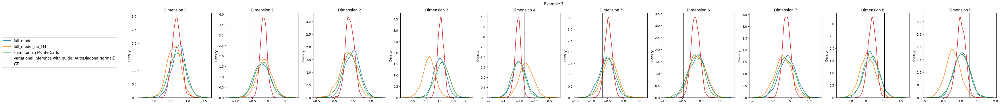

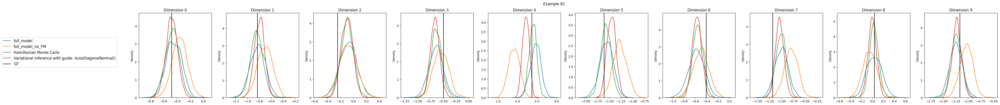

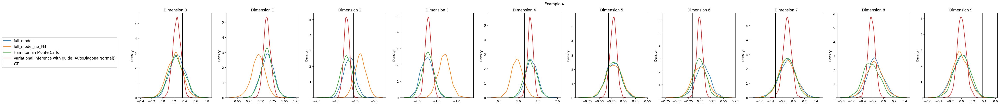

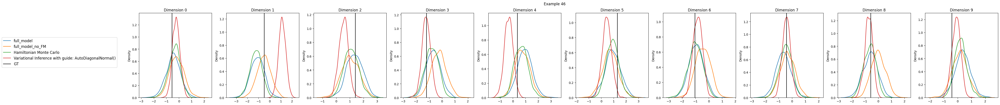

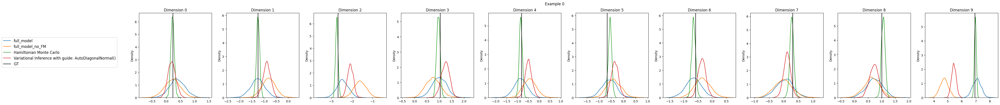

In [ ]:
evaluation.plot_results()